In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
columns_and_dtypes = {
    'Airline': "category", # 2-letter (IATA) or 3-letter (ICAO) code of the airline.
    'Airline ID': "category", # Unique OpenFlights identifier for airline.
    'Source Airport': "category", # 3-letter (IATA) or 4-letter (ICAO) code of the source airport.
    'Source Airport ID': "category", # Unique OpenFlights identifier for source airport.
    'Destination Airport': "category", # 3-letter (IATA) or 4-letter (ICAO) code of the destination airport.
    'Destination Airport ID': "category", # Unique OpenFlights identifier for destination airport.
    'Codeshare': "category", # "Y" if this flight is a codeshare (that is, not operated by Airline, but another carrier), empty otherwise.
    'Stops': int, # Number of stops on this flight ("0" for direct)
    'Equipment': "category" # 3-letter codes for plane type(s) generally used on this flight, separated by spaces
}
routes = pd.read_csv('C:/Users/leiden/Desktop/NTU Masters/Analytics workshop 2/Project/airport-disease-modeling-master/data/routes.dat',
                     names=columns_and_dtypes.keys(),
                     dtype=columns_and_dtypes)
display(routes.head(10))

,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment
0,2B,410,AER,2965,ASF,2966,NaN,0,CR2
1,2B,410,AER,2965,GOJ,4274,NaN,0,CR2
2,2B,410,AER,2965,KRR,2960,NaN,0,CR2
3,2B,410,AER,2965,KZN,2990,NaN,0,CR2
4,2B,410,AER,2965,MCX,2961,NaN,0,CR2
5,2B,410,AER,2965,MRV,2962,NaN,0,CR2
6,2B,410,AER,2965,NBC,6969,NaN,0,CR2
7,2B,410,AER,2965,ROV,2964,NaN,0,CR2
8,2B,410,AER,2965,UUA,6160,NaN,0,CR2
9,2B,410,ASF,2966,AER,2965,NaN,0,CR2


Null values per column:
Airline                       0
Airline ID                    0
Source Airport                0
Source Airport ID             0
Destination Airport           0
Destination Airport ID        0
Codeshare                 52280
Stops                         0
Equipment                    63
dtype: int64


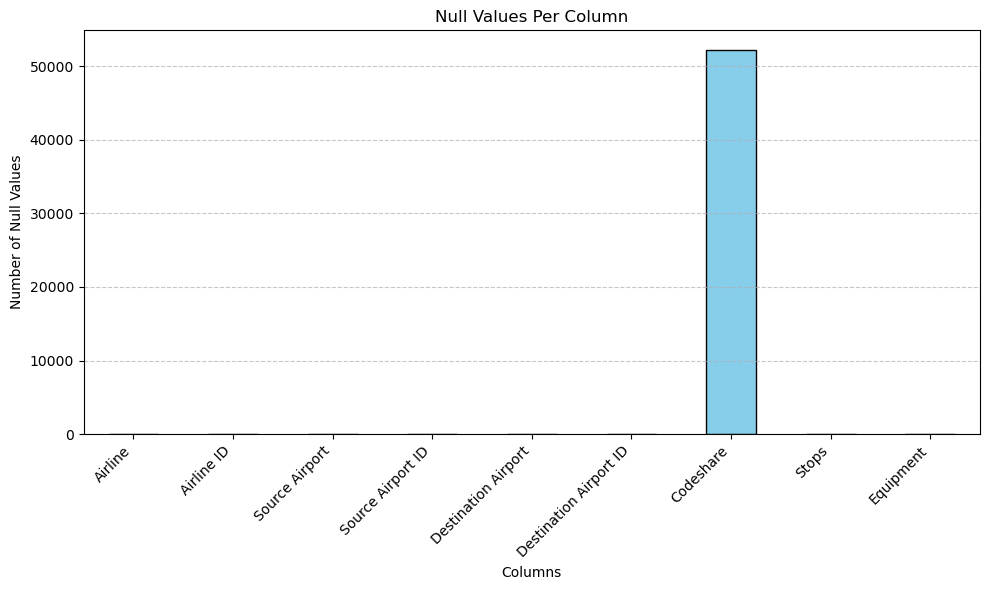

In [ ]:
import matplotlib.pyplot as plt

# Check for null values in each column
null_counts = routes.isnull().sum()

# Display the count of null values per column
print("Null values per column:")
print(null_counts)

# Plot bar graph for null values
plt.figure(figsize=(10, 6))
null_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Null Values Per Column")
plt.xlabel("Columns")
plt.ylabel("Number of Null Values")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# Use a raw string or double backslash for "\N"
missing_count = routes.apply(lambda col: col.isin([r'\N']).sum())

# Display the results
print("Count of '\\N' in each column:")
print(missing_count)



Count of '\N' in each column:
Airline                     0
Airline ID                742
Source Airport              0
Source Airport ID         234
Destination Airport         0
Destination Airport ID    239
Codeshare                   0
Stops                       0
Equipment                   0
dtype: int64


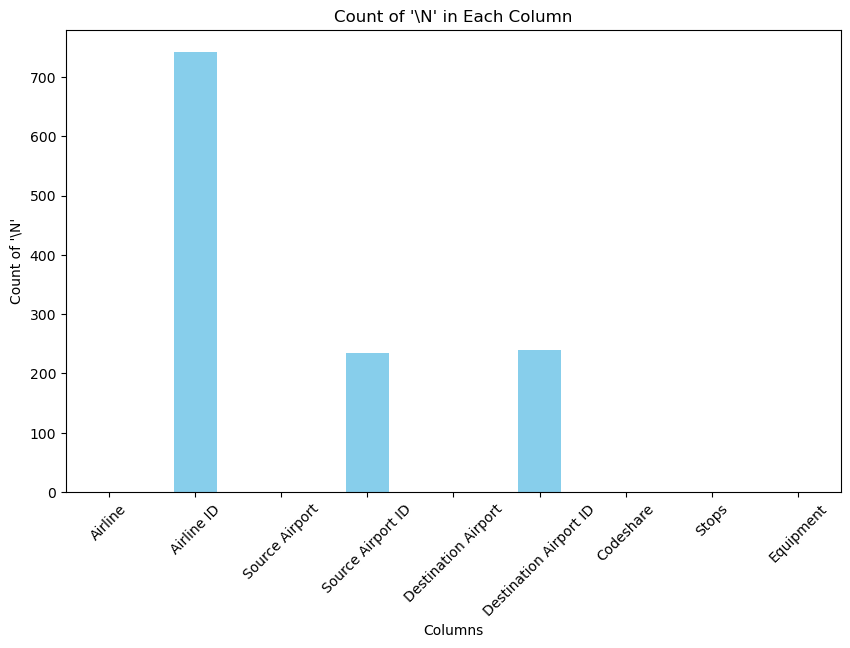

In [ ]:
import matplotlib.pyplot as plt

missing_count.plot(kind='bar', figsize=(10, 6), color='skyblue')
plt.title("Count of '\\N' in Each Column")
plt.xlabel("Columns")
plt.ylabel("Count of '\\N'")
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Filter rows where 'Source Airport' contains '\N'
source_null = routes['Source Airport'] == r'\N'

# Filter rows where 'Destination Airport' contains '\N'
dest_null = routes['Destination Airport'] == r'\N'

# Check rows where both columns contain '\N'
both_null = routes[source_null & dest_null]

# Display the results
print(f"Total rows with '\\N' in both 'Source Airport' and 'Destination Airport': {len(both_null)}")
display(both_null)


Total rows with '\N' in both 'Source Airport' and 'Destination Airport': 0


,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment


## Since we are using IATA codes from Source Airport and Destination Airport, we ignore the missing values in both of the Airport IDs.

In [ ]:
# Find the count of "/N" in each column
missing_count = routes.apply(lambda col: col.isin(['NaN']).sum())

# Display the results
print("Count of '/N' in each column:")
print(missing_count)

Count of '/N' in each column:
Airline                   0
Airline ID                0
Source Airport            0
Source Airport ID         0
Destination Airport       0
Destination Airport ID    0
Codeshare                 0
Stops                     0
Equipment                 0
dtype: int64


In [ ]:
# Check if all values in the "Stops" column are zero
all_stops_zero = (routes['Stops'] == 0).all()

if all_stops_zero:
    print("All values in the 'Stops' column are zero.")
else:
    print("The 'Stops' column contains non-zero values.")

# Display rows where "Stops" is not zero (if any)
non_zero_stops = routes[routes['Stops'] != 0]
if not non_zero_stops.empty:
    print("\nRows with non-zero 'Stops':")
    display(non_zero_stops)
else:
    print("\nNo rows with non-zero 'Stops'.")


The 'Stops' column contains non-zero values.

Rows with non-zero 'Stops':


,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment
7249,AC,330,YBL,30,YVR,156,NaN,1,BEH
7457,AC,330,YVR,156,YBL,30,NaN,1,BEH
7466,AC,330,YVR,156,YQQ,119,NaN,1,BEH
16322,CU,1936,HAV,1909,FCO,1555,NaN,1,767
16338,CU,1936,HOG,1910,HAV,1909,NaN,1,737


In [ ]:
columns_and_dtypes = {
    'Airport ID': "category", # Unique OpenFlights identifier for this airport.
    'Airport Name': "category", # Name of airport. May or may not contain the City name.
    'City': "category", # Main city served by airport. May be spelled differently from Name.
    'Country': "category", # or territory where airport is located. See Countries to cross-reference to ISO 3166-1 codes.
    'IATA': "category", # 3-letter IATA code. Null if not assigned/unknown.
    'ICAO': "category", # 4-letter ICAO code. Null if not assigned.
    'Latitude': float, # Decimal degrees, usually to six significant digits. Negative is South, positive is North.
    'Longitude': float, # Decimal degrees, usually to six significant digits. Negative is West, positive is East.
    'Altitude': float, # In feet.
    'Timezone': "category", # Hours offset from UTC. Fractional hours are expressed as decimals, eg. India is 5.5.
    'DST': "category", # Daylight savings time. One of E (Europe), A (US/Canada), S (South America), O (Australia), Z (New Zealand), N (None) or U (Unknown). See also: Help: Time
    'Tz database time zone': "category", # Timezone in "tz" (Olson) format, eg. "America/Los_Angeles".
    'Type': "category", # Type of the airport. Value "airport" for air terminals, "station" for train stations, "port" for ferry terminals and "unknown" if not known. In airports.csv, only type=airport is included.
    'Source': "category", # Source of this data.
}
airports = pd.read_csv('C:/Users/leiden/Desktop/NTU Masters/Analytics workshop 2/Project/airport-disease-modeling-master/data/airports.dat',
                     names=columns_and_dtypes.keys(),
                     dtype=columns_and_dtypes)

display(airports.head(10))

,Airport ID,Airport Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
0,1,Goroka,Goroka,Papua New Guinea,GKA,AYGA,-6.081689,145.391881,5282.0,10,U,NaN,NaN,NaN
1,2,Madang,Madang,Papua New Guinea,MAG,AYMD,-5.207083,145.788700,20.0,10,U,NaN,NaN,NaN
2,3,Mount Hagen,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789,144.295861,5388.0,10,U,NaN,NaN,NaN
3,4,Nadzab,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569828,146.726242,239.0,10,U,NaN,NaN,NaN
4,5,Port Moresby Jacksons Intl,Port Moresby,Papua New Guinea,POM,AYPY,-9.443383,147.220050,146.0,10,U,NaN,NaN,NaN
5,6,Wewak Intl,Wewak,Papua New Guinea,WWK,AYWK,-3.583828,143.669186,19.0,10,U,NaN,NaN,NaN
6,7,Narsarsuaq,Narssarssuaq,Greenland,UAK,BGBW,61.160517,-45.425978,112.0,-3,E,NaN,NaN,NaN
7,8,Nuuk,Godthaab,Greenland,GOH,BGGH,64.190922,-51.678064,283.0,-3,E,NaN,NaN,NaN
8,9,Sondre Stromfjord,Sondrestrom,Greenland,SFJ,BGSF,67.016969,-50.689325,165.0,-3,E,NaN,NaN,NaN
9,10,Thule Air Base,Thule,Greenland,THU,BGTL,76.531203,-68.703161,251.0,-4,E,NaN,NaN,NaN


In [ ]:
# Get the total number of rows
total_rows = airports.shape[0]

print(f"Total number of rows in the dataset: {total_rows}")


Total number of rows in the dataset: 7663


Null values per column:
Airport ID                  0
Airport Name                0
City                        0
Country                     0
IATA                     1919
ICAO                       64
Latitude                    0
Longitude                   0
Altitude                    0
Timezone                    0
DST                         0
Tz database time zone    7663
Type                     7663
Source                   7663
dtype: int64


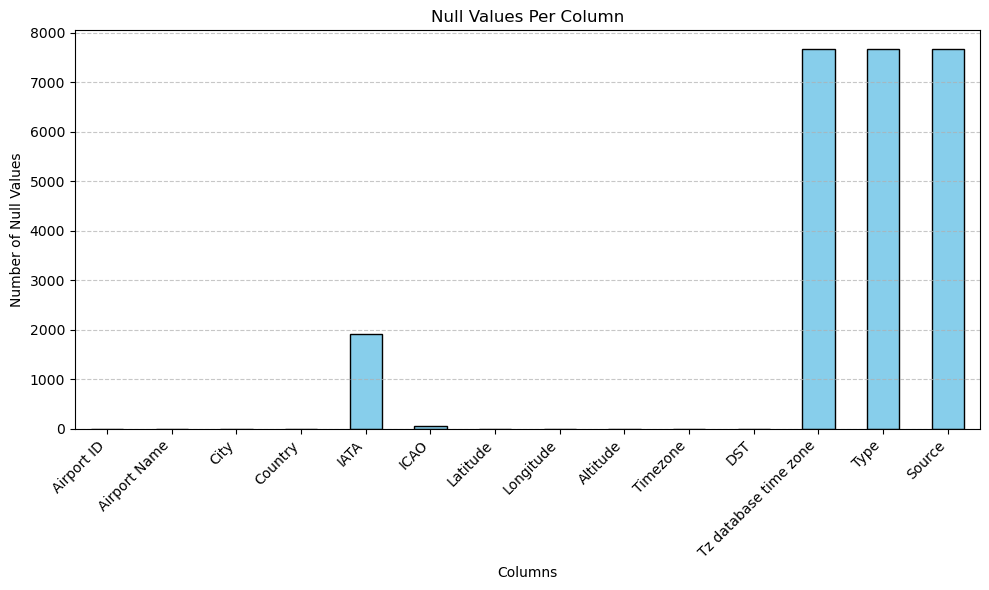

In [ ]:
import matplotlib.pyplot as plt

# Check for null values in each column
null_counts = airports.isnull().sum()

# Display the count of null values per column
print("Null values per column:")
print(null_counts)

# Plot bar graph for null values
plt.figure(figsize=(10, 6))
null_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Null Values Per Column")
plt.xlabel("Columns")
plt.ylabel("Number of Null Values")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
# Drop the specified columns
airports_cleaned = airports.drop(columns=['Tz database time zone', 'Type', 'Source'])

# Remove rows where 'IATA' has null values
airports_cleaned = airports_cleaned.dropna(subset=['IATA'])

# Display the cleaned data
print(f"Data after cleaning:")
display(airports_cleaned.head(10))

# Check the number of rows after cleaning
print(f"\nNumber of rows after cleaning: {airports_cleaned.shape[0]}")


Data after cleaning:


,Airport ID,Airport Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST
0,1,Goroka,Goroka,Papua New Guinea,GKA,AYGA,-6.081689,145.391881,5282.0,10,U
1,2,Madang,Madang,Papua New Guinea,MAG,AYMD,-5.207083,145.788700,20.0,10,U
2,3,Mount Hagen,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789,144.295861,5388.0,10,U
3,4,Nadzab,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569828,146.726242,239.0,10,U
4,5,Port Moresby Jacksons Intl,Port Moresby,Papua New Guinea,POM,AYPY,-9.443383,147.220050,146.0,10,U
5,6,Wewak Intl,Wewak,Papua New Guinea,WWK,AYWK,-3.583828,143.669186,19.0,10,U
6,7,Narsarsuaq,Narssarssuaq,Greenland,UAK,BGBW,61.160517,-45.425978,112.0,-3,E
7,8,Nuuk,Godthaab,Greenland,GOH,BGGH,64.190922,-51.678064,283.0,-3,E
8,9,Sondre Stromfjord,Sondrestrom,Greenland,SFJ,BGSF,67.016969,-50.689325,165.0,-3,E
9,10,Thule Air Base,Thule,Greenland,THU,BGTL,76.531203,-68.703161,251.0,-4,E



Number of rows after cleaning: 5744


Null values per column:
Airport ID       0
Airport Name     0
City             0
Country          0
IATA             0
ICAO            63
Latitude         0
Longitude        0
Altitude         0
Timezone         0
DST              0
dtype: int64


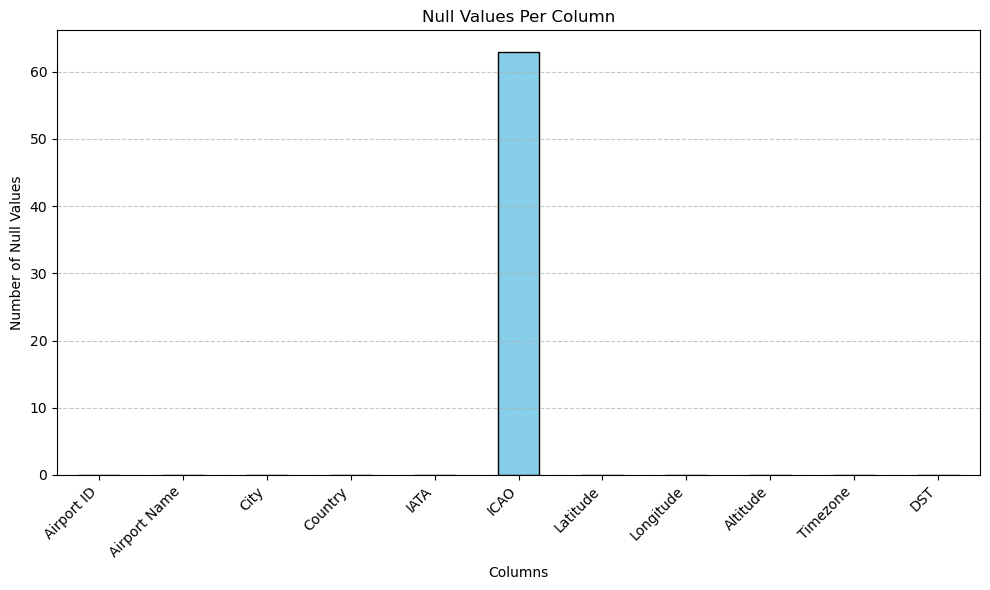

In [ ]:
#check again for null values on IATA

# Check for null values in each column
null_counts = airports_cleaned.isnull().sum()

# Display the count of null values per column
print("Null values per column:")
print(null_counts)

# Plot bar graph for null values
plt.figure(figsize=(10, 6))
null_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Null Values Per Column")
plt.xlabel("Columns")
plt.ylabel("Number of Null Values")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [ ]:
# Number of airports by country.
airports_cleaned["Country"].value_counts().head(10)

Country
United States     1388
Canada             355
Australia          210
China              180
Brazil             168
Russia             143
France             129
Germany            126
United Kingdom     114
India              101
Name: count, dtype: int64

In [ ]:
# Build edges using 'Source Airport' and 'Destination Airport'
edges = routes[['Source Airport', 'Destination Airport']].copy()

# Rename the columns for clarity
edges.columns = ['IATA_From', 'IATA_To']

# Display the first 10 rows of the edges
print("Edges (IATA_From and IATA_To):")
display(edges.head(10))


Edges (IATA_From and IATA_To):


,IATA_From,IATA_To
0,AER,ASF
1,AER,GOJ
2,AER,KRR
3,AER,KZN
4,AER,MCX
5,AER,MRV
6,AER,NBC
7,AER,ROV
8,AER,UUA
9,ASF,AER


In [ ]:
# Get the total number of rows
total_rows = edges.shape[0]

print(f"Total number of rows in the dataset: {total_rows}")

Total number of rows in the dataset: 68820


In [ ]:
import networkx as nx
# Create the edge list and nodes
relations = edges[['IATA_From', 'IATA_To']].astype(str)
names = pd.concat([edges['IATA_From'], edges['IATA_To']]).drop_duplicates().astype(str)

display(names.head(10))


0     AER
9     ASF
12    CEK
14    DME
18    GDZ
19    GOJ
20    GYD
22    KBP
23    KRR
25    KUF
dtype: object

Nodes with degree less than 2: ['KKB', 'KZB', 'KYK', 'KWP', 'LUR', 'MBZ', 'KZI', 'KFP', 'KVC', 'PML', 'UGB', 'PBU', 'PYY', 'BVS', 'MTE', 'SMQ', 'IUE', 'INU', 'DAM', 'CMP', 'BSS', 'STZ', 'SXX', 'OMD', 'BGG']


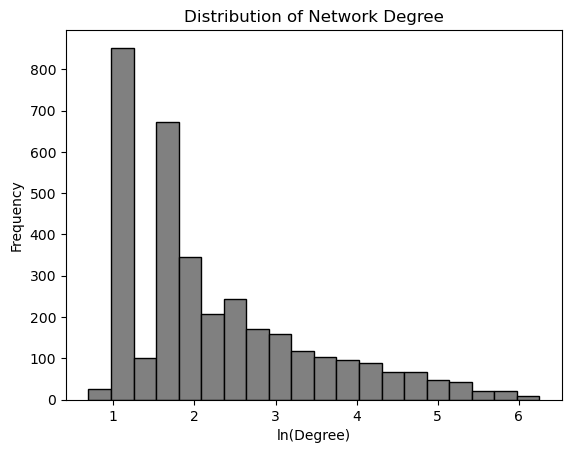

In [ ]:
# Create a directed graph
G = nx.DiGraph()
G.add_edges_from(relations.values)
G.add_nodes_from(names)

# Find nodes with degree less than 2
low_degree_nodes = [node for node, degree in G.degree() if degree < 2]
print("Nodes with degree less than 2:", low_degree_nodes)

# Degree distribution for all airports
degrees = np.array([d for _, d in G.degree()])
log_degrees = np.log(degrees + 1)  # Add 1 to avoid log(0)
plt.hist(log_degrees, bins=20, color="gray", edgecolor="black")
plt.title("Distribution of Network Degree")
plt.xlabel("ln(Degree)")
plt.ylabel("Frequency")
plt.show()


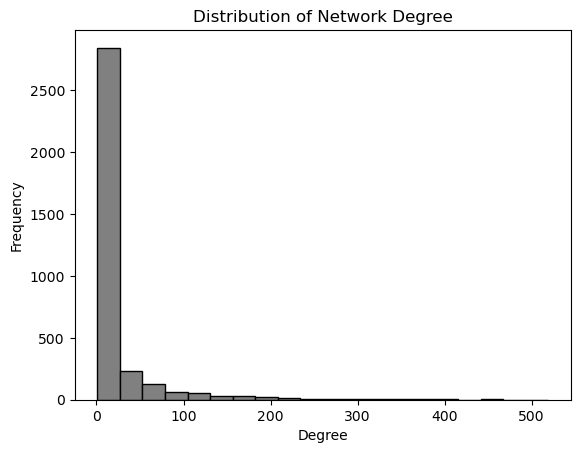

In [ ]:
# Degree distribution for all airports
degrees = np.array([d for _, d in G.degree()])
plt.hist(degrees, bins=20, color="gray", edgecolor="black")  # Use raw degrees
plt.title("Distribution of Network Degree")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Define a function to calculate Haversine distance
def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the great-circle distance between two points on the Earth.
    Inputs are latitude and longitude in decimal degrees.
    Returns distance in kilometers.
    """
    R = 6371  # Earth radius in kilometers
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])  # Convert degrees to radians

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return R * c

# Merge `routes` with `airports` for source and destination coordinates
# Join for source coordinates
routes = routes.merge(
    airports_cleaned[['IATA', 'Latitude', 'Longitude']],
    how='left',
    left_on='Source Airport',
    right_on='IATA'
).rename(columns={'Latitude': 'Source_Lat', 'Longitude': 'Source_Lon'}).drop(columns=['IATA'])

# Join for destination coordinates
routes = routes.merge(
    airports_cleaned[['IATA', 'Latitude', 'Longitude']],
    how='left',
    left_on='Destination Airport',
    right_on='IATA'
).rename(columns={'Latitude': 'Dest_Lat', 'Longitude': 'Dest_Lon'}).drop(columns=['IATA'])

# Calculate distances using the Haversine formula
routes['Distance_km'] = haversine(
    routes['Source_Lat'],
    routes['Source_Lon'],
    routes['Dest_Lat'],
    routes['Dest_Lon']
)

# Display routes with calculated distances
display(routes[['Source Airport', 'Destination Airport', 'Distance_km']].head(10))

# Check for routes with missing coordinates
missing_coords = routes[routes[['Source_Lat', 'Source_Lon', 'Dest_Lat', 'Dest_Lon']].isnull().any(axis=1)]
if not missing_coords.empty:
    print("Routes with missing coordinates:")
    display(missing_coords)
else:
    print("All routes have valid coordinates.")


,Source Airport,Destination Airport,Distance_km
0,AER,ASF,707.856363
1,AER,GOJ,1446.786129
2,AER,KRR,187.009058
3,AER,KZN,1506.822657
4,AER,MCX,628.202037
5,AER,MRV,265.050658
6,AER,NBC,1581.001669
7,AER,ROV,423.599476
8,AER,UUA,1552.004378
9,ASF,AER,707.856363


Routes with missing coordinates:


,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment,Source_Lat,Source_Lon,Dest_Lat,Dest_Lon,Distance_km
16,2B,410,DME,4029,TGK,\N,NaN,0,CR2,55.408611,37.906111,NaN,NaN,NaN
63,2B,410,TGK,\N,DME,4029,NaN,0,CR2,NaN,NaN,55.408611,37.906111,NaN
190,2O,146,KPY,7171,UGI,\N,NaN,0,BNI,57.930000,-153.040556,NaN,NaN,NaN
191,2O,146,UGI,\N,KWP,7175,NaN,0,BNI,NaN,NaN,57.770000,-153.548889,NaN
280,2P,897,TWT,\N,ZAM,2404,NaN,0,DH4,NaN,NaN,6.922419,122.059633,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68533,ZH,4611,ZYI,\N,PEK,3364,Y,0,737,NaN,NaN,40.080111,116.584556,NaN
68552,ZI,21,CFK,\N,MRS,1353,NaN,0,319,NaN,NaN,43.435555,5.213611,NaN
68578,ZI,21,MRS,1353,CFK,\N,NaN,0,319,43.435555,5.213611,NaN,NaN,NaN
68669,ZK,2607,GBD,\N,HYS,7014,NaN,0,BE1,NaN,NaN,38.842200,-99.273200,NaN


In [ ]:
# Calculate the proportion of missing values
missing_percentage = len(missing_coords) / len(routes) * 100
print(f"Percentage of missing routes: {missing_percentage:.2f}%")


Percentage of missing routes: 0.64%


In [ ]:
# Save missing routes for further analysis
#missing_coords.to_csv('missing_routes.csv', index=False)


In [ ]:
# Drop rows where 'distance' is NaN
routes = routes.dropna(subset=['Distance_km'])

# Verify the result
print(f"Remaining rows in routes after dropping NaN distances: {len(routes)}")
display(routes.head())


Remaining rows in routes after dropping NaN distances: 68382


,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment,Source_Lat,Source_Lon,Dest_Lat,Dest_Lon,Distance_km
0,2B,410,AER,2965,ASF,2966,NaN,0,CR2,43.449928,39.956589,46.283333,48.006278,707.856363
1,2B,410,AER,2965,GOJ,4274,NaN,0,CR2,43.449928,39.956589,56.230119,43.784042,1446.786129
2,2B,410,AER,2965,KRR,2960,NaN,0,CR2,43.449928,39.956589,45.034689,39.170539,187.009058
3,2B,410,AER,2965,KZN,2990,NaN,0,CR2,43.449928,39.956589,55.606186,49.278728,1506.822657
4,2B,410,AER,2965,MCX,2961,NaN,0,CR2,43.449928,39.956589,42.816822,47.652294,628.202037


C:\Users\leiden\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


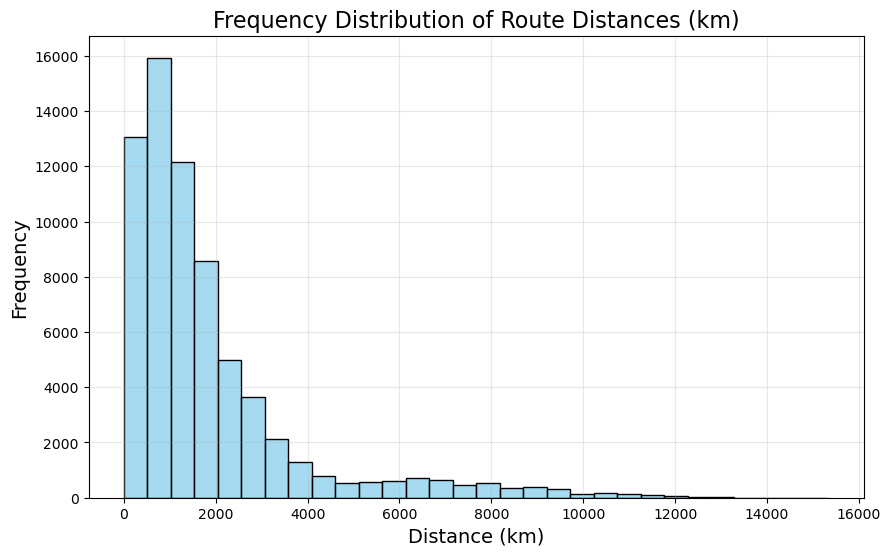

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure
plt.figure(figsize=(10, 6))

# Plot a histogram
sns.histplot(routes['Distance_km'], bins=30, kde=False, color='skyblue', edgecolor='black')
plt.title('Frequency Distribution of Route Distances (km)', fontsize=16)
plt.xlabel('Distance (km)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(alpha=0.3)
plt.show()


In [ ]:
#pip install cartopy

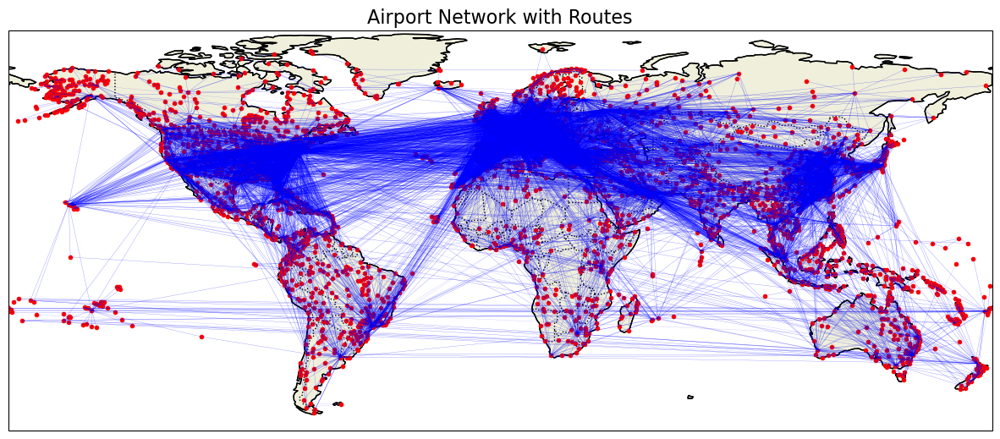

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the airport locations
for airport, (lon, lat) in positions.items():
    plt.plot(lon, lat, marker='o', markersize=3, color='red', transform=ccrs.PlateCarree())

# Plot the routes
for source, dest in G.edges:
    if source in positions and dest in positions:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]
        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.2,
            alpha=0.3,
            transform=ccrs.PlateCarree()
        )

# Add a title and show the plot
plt.title("Airport Network with Routes", fontsize=16)
plt.show()


In [ ]:
# import folium

# # Initialize a map
# m = folium.Map(location=[20, 0], zoom_start=2)

# # Add routes as polylines
# for _, row in routes.iterrows():
#     folium.PolyLine(
#         [(row['Source_Lat'], row['Source_Lon']), (row['Dest_Lat'], row['Dest_Lon'])],
#         color='blue',
#         weight=1,
#         opacity=0.5
#     ).add_to(m)

# # Show the map
# m.save('routes_map.html')


In [ ]:
# # Display only routes with distances > 5000 km
# filtered_routes = routes[routes['distance'] > 5000]

# # Add edges to the graph with the filtered routes
# for _, row in filtered_routes.iterrows():
#     G.add_edge(
#         row['Source Airport'],
#         row['Destination Airport'],
#         distance=row['distance']
#     )


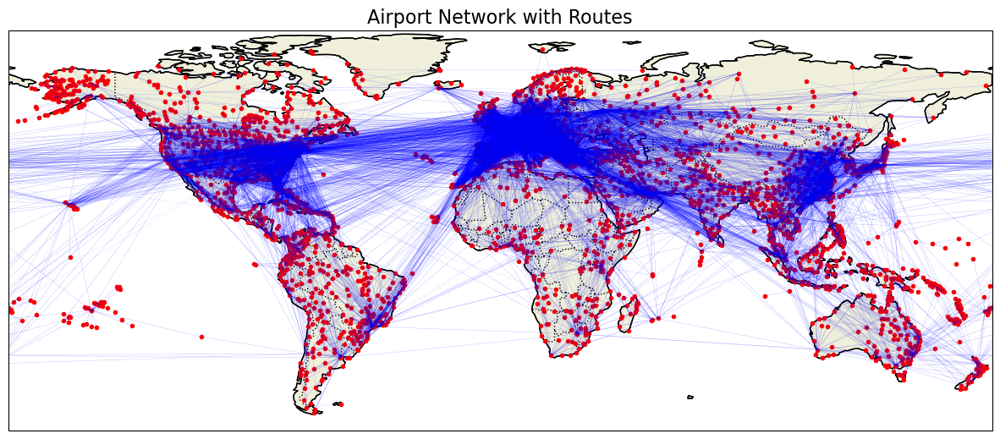

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Function to adjust the longitude for wrapping
def adjust_longitude(lon1, lon2):
    # If the longitude difference exceeds 180 degrees, adjust by wrapping around the map
    if abs(lon1 - lon2) > 180:
        if lon1 > lon2:
            lon2 += 360  # Adjust by adding 360 to lon2
        else:
            lon1 += 360  # Adjust by adding 360 to lon1
    return lon1, lon2

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the airport locations
for airport, (lon, lat) in positions.items():
    plt.plot(lon, lat, marker='o', markersize=3, color='red', transform=ccrs.PlateCarree())

# Plot the routes
for source, dest in G.edges:
    if source in positions and dest in positions:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes if necessary to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        # Plot the route between airports
        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.2,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Add a title and show the plot
plt.title("Airport Network with Routes", fontsize=16)
plt.show()


In [ ]:
# import folium

# # Function to adjust the longitude for wrapping in Folium as well
# def adjust_longitude_folium(lon1, lon2):
#     if abs(lon1 - lon2) > 180:
#         if lon1 > lon2:
#             lon2 += 360  # Adjust by adding 360 to lon2
#         else:
#             lon1 += 360  # Adjust by adding 360 to lon1
#     return lon1, lon2

# # Initialize a map
# m = folium.Map(location=[20, 0], zoom_start=2)

# # Add airports as markers
# for airport, (lon, lat) in positions.items():
#     folium.Marker(
#         location=[lat, lon],
#         popup=airport,
#         icon=folium.Icon(color="red")
#     ).add_to(m)

# # Add routes as polylines with adjusted longitudes
# for source, dest in G.edges:
#     if source in positions and dest in positions:
#         lon1, lat1 = positions[source]
#         lon2, lat2 = positions[dest]

#         # Adjust longitudes if necessary to prevent wrapping
#         lon1, lon2 = adjust_longitude_folium(lon1, lon2)

#         # Add a polyline for the route between the airports
#         folium.PolyLine(
#             locations=[(lat1, lon1), (lat2, lon2)],
#             color='blue',
#             weight=1,
#             opacity=0.5
#         ).add_to(m)

# # Save the map to an HTML file
# m.save('airport_routes_map.html')


In [ ]:

# PageRank centrality
pagerank = nx.pagerank(G)

# Out-degree centrality
out_degree = dict(G.out_degree())

# Betweenness centrality
betweenness = nx.betweenness_centrality(G)


In [ ]:
# Normalize centralities (scaling by maximum value)
max_pagerank = max(pagerank.values())
max_out_degree = max(out_degree.values())
max_betweenness = max(betweenness.values())

normalized_pagerank = {node: value / max_pagerank for node, value in pagerank.items()}
normalized_out_degree = {node: value / max_out_degree for node, value in out_degree.items()}
normalized_betweenness = {node: value / max_betweenness for node, value in betweenness.items()}


In [ ]:
# Define weights for each centrality measure
w_pagerank = 0.4  # Weight for PageRank
w_out_degree = 0.4  # Weight for Out-degree
w_betweenness = 0.2  # Weight for Betweenness

# Create a composite centrality score for each airport
composite_centrality = {}

for node in G.nodes():
    composite_centrality[node] = (w_pagerank * normalized_pagerank.get(node, 0) +
                                  w_out_degree * normalized_out_degree.get(node, 0) +
                                  w_betweenness * normalized_betweenness.get(node, 0))


In [ ]:
# Sort airports by their composite centrality score in descending order
sorted_airports = sorted(composite_centrality.items(), key=lambda x: x[1], reverse=True)

# Display the top airports with highest composite centrality
for airport, score in sorted_airports[:20]:
    print(f"Airport: {airport}, Composite Centrality Score: {score}")

# Get the top 20 airports based on composite centrality
top_20_airports = sorted_airports[:20]
top_20_airports_set = set([airport for airport, score in top_20_airports])


Airport: FRA, Composite Centrality Score: 0.9349960656509526
Airport: ATL, Composite Centrality Score: 0.8452680259059634
Airport: CDG, Composite Centrality Score: 0.8086966602784048
Airport: ORD, Composite Centrality Score: 0.8078662994697852
Airport: AMS, Composite Centrality Score: 0.7852528165558099
Airport: IST, Composite Centrality Score: 0.7519887219552461
Airport: DFW, Composite Centrality Score: 0.7478646297892497
Airport: PEK, Composite Centrality Score: 0.7333688341573876
Airport: DEN, Composite Centrality Score: 0.7282167918112548
Airport: DXB, Composite Centrality Score: 0.7221506522764085
Airport: DME, Composite Centrality Score: 0.7132502235535121
Airport: LAX, Composite Centrality Score: 0.6903881696933696
Airport: IAH, Composite Centrality Score: 0.6467218591448829
Airport: YYZ, Composite Centrality Score: 0.6127814128645064
Airport: JFK, Composite Centrality Score: 0.590469178941192
Airport: MUC, Composite Centrality Score: 0.5637408304413493
Airport: LGW, Composite C

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Sort airports by composite centrality score (assuming you have already calculated this)
# For demonstration, let's assume top_20_airports_set is already defined
# (you would use the sorted composite centrality logic here)

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot only the top 20 airports with yellow color and others with red color
for airport, (lon, lat) in positions.items():
    if airport in top_20_airports_set:
        # Top 20 airports in yellow
        plt.plot(lon, lat, marker='o', markersize=10, color='yellow', transform=ccrs.PlateCarree())
    else:
        # Other airports in red
        plt.plot(lon, lat, marker='o', markersize=2, color='red', transform=ccrs.PlateCarree())

# Plot the routes (edges) for all airports
for source, dest in G.edges:
    lon1, lat1 = positions.get(source, (None, None))
    lon2, lat2 = positions.get(dest, (None, None))

    if lon1 is None or lon2 is None:
        continue  # Skip if either of the airports doesn't have a position

    # Adjust longitudes if necessary to prevent wrapping
    lon1, lon2 = adjust_longitude(lon1, lon2)

    # Check if the route is between top 20 airports
    if source in top_20_airports_set and dest in top_20_airports_set:
        # Routes between top 20 airports in blue
        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='red',  # Color of the route
            linewidth=0.5,  # Line width
            alpha=0.5,  # Transparency
            transform=ccrs.PlateCarree()
        )
    else:
        # Routes involving other airports in light gray
        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='gray',  # Color for other routes
            linewidth=0.2,  # Line width
            alpha=0.2,  # Transparency
            transform=ccrs.PlateCarree()
        )

# Add a title and show the plot
plt.title("Airport Network with Routes Based on Composite Centrality", fontsize=16)
plt.show()



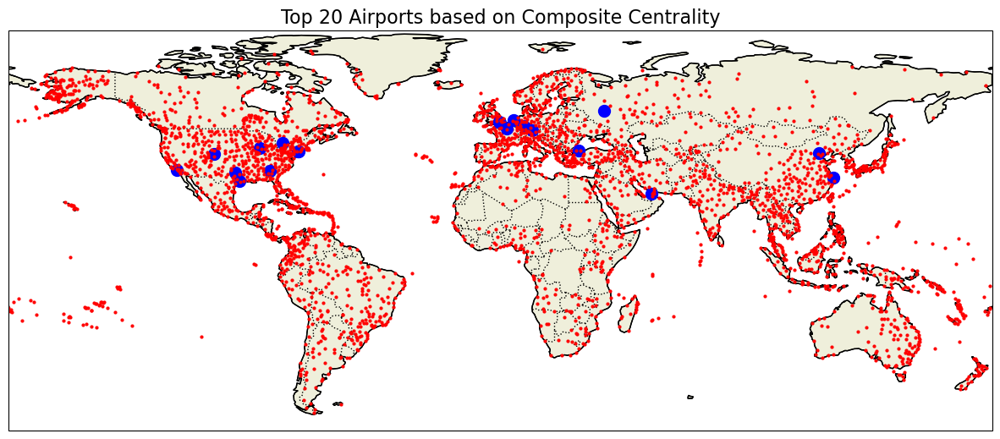

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Sort airports by composite centrality score (assuming you have already calculated this)
# For demonstration, let's assume top_20_airports_set is already defined
# (you would use the sorted composite centrality logic here)

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot only the top 20 airports with yellow color and others with red color
for airport, (lon, lat) in positions.items():
    if airport in top_20_airports_set:
        # Top 20 airports in blue
        plt.plot(lon, lat, marker='o', markersize=10, color='blue', transform=ccrs.PlateCarree())
    else:
        # Other airports in red
        plt.plot(lon, lat, marker='o', markersize=2, color='red', transform=ccrs.PlateCarree())

# # Plot the routes (edges) for all airports
# for source, dest in G.edges:
#     lon1, lat1 = positions.get(source, (None, None))
#     lon2, lat2 = positions.get(dest, (None, None))

#     if lon1 is None or lon2 is None:
#         continue  # Skip if either of the airports doesn't have a position

#     # Adjust longitudes if necessary to prevent wrapping
#     lon1, lon2 = adjust_longitude(lon1, lon2)

#     # Check if the route is between top 20 airports
#     if source in top_20_airports_set and dest in top_20_airports_set:
#         # Routes between top 20 airports in blue
#         plt.plot(
#             [lon1, lon2],
#             [lat1, lat2],
#             color='red',  # Color of the route
#             linewidth=0.5,  # Line width
#             alpha=0.5,  # Transparency
#             transform=ccrs.PlateCarree()
#         )
#     else:
#         # Routes involving other airports in light gray
#         plt.plot(
#             [lon1, lon2],
#             [lat1, lat2],
#             color='gray',  # Color for other routes
#             linewidth=0.2,  # Line width
#             alpha=0.2,  # Transparency
#             transform=ccrs.PlateCarree()
#         )

# Add a title and show the plot
plt.title("Top 20 Airports based on Composite Centrality", fontsize=16)
plt.show()



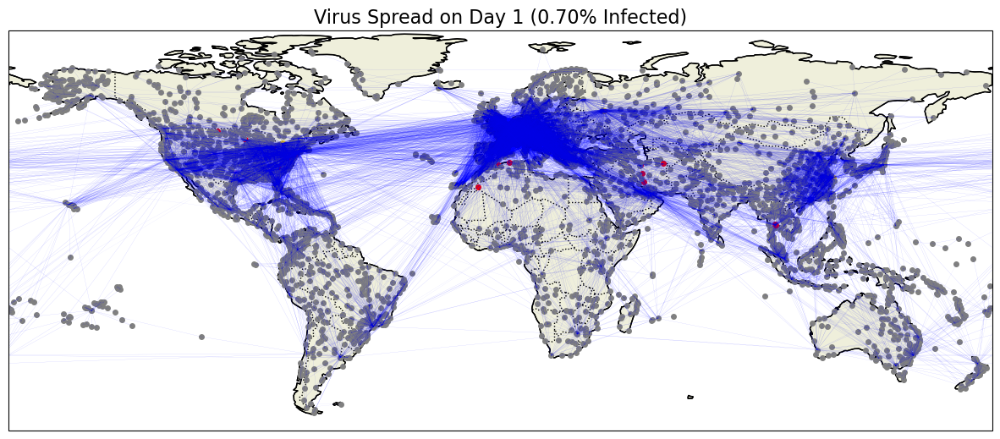

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Simulation Parameters
decay_rate = 2
simulation_days = 10
initial_infected_count = 5
random_seed = 16  # Set the seed for reproducibility

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Randomly select initial infected airports
initial_infected = random.sample(list(G.nodes), initial_infected_count)

# Get the top 20 airports
top_20_airports = sorted_airports[:20]
top_20_airports_set = set([airport for airport, score in top_20_airports])

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days)]

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.1, 1 - (day - infected[airport]) / decay_rate)
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = day + 1

        active = new_infected
        spread_history[day] = {a for a in infected if infected[a] > 0}
    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)

# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day + 1} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            color = 'red'  # Infected
            if airport in top_20_airports_set:
                color = 'pink'  # Top 20 and infected
            else:
                color = 'red'  # Infected but not top 20
        else:
            if airport in top_20_airports_set:
                color = 'gold'  # Top 20 but not infected
            else:
                color = 'gray'  # Not infected and not top 20
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

ani = FuncAnimation(fig, update, frames=simulation_days, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_with_percentage.gif", writer='pillow', fps=1)



## Decay rate = 1

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 1
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility
initial_infected_count = 5

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Randomly select initial infected airports
initial_infected = random.sample(list(G.nodes), initial_infected_count)

print(initial_infected)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- day / decay_rate))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1
        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)


['CBH', 'UBP', 'DIK', 'SAV', 'ABD']


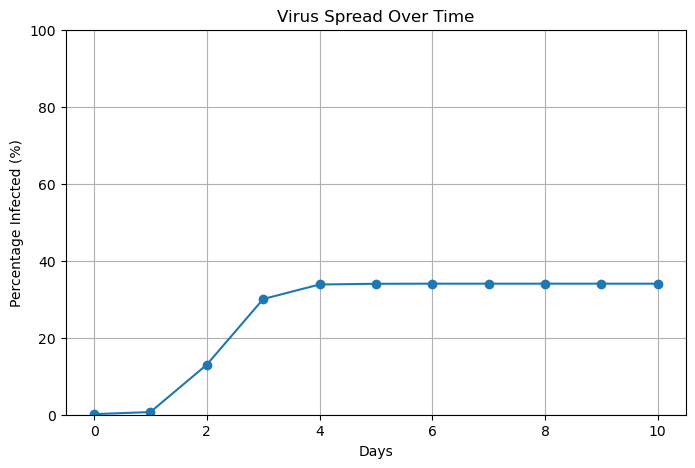

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()


### No touchy touchy unless you want your comp to hang

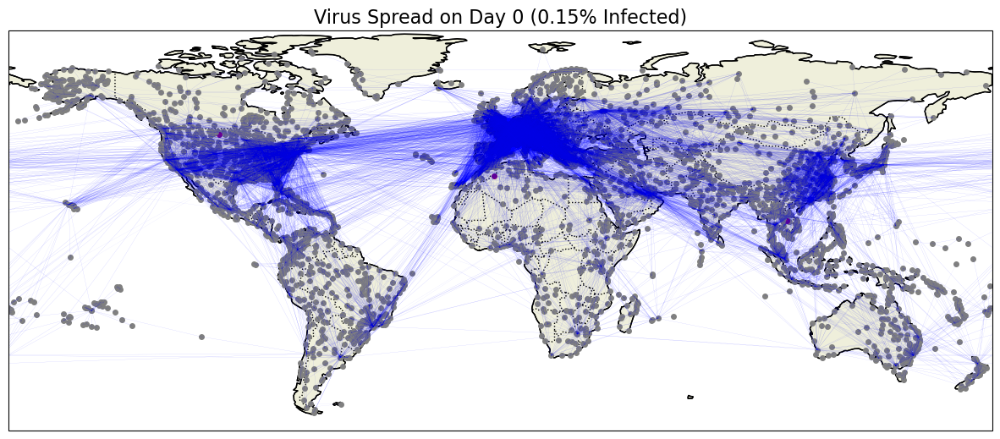

In [ ]:


# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_decayrate1.gif", writer='pillow', fps=1)



## Decay rate = 0.1

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 0.1
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility
initial_infected_count = 5

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Randomly select initial infected airports
initial_infected = random.sample(list(G.nodes), initial_infected_count)

print(initial_infected)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)


['CBH', 'UBP', 'DIK', 'SAV', 'ABD']


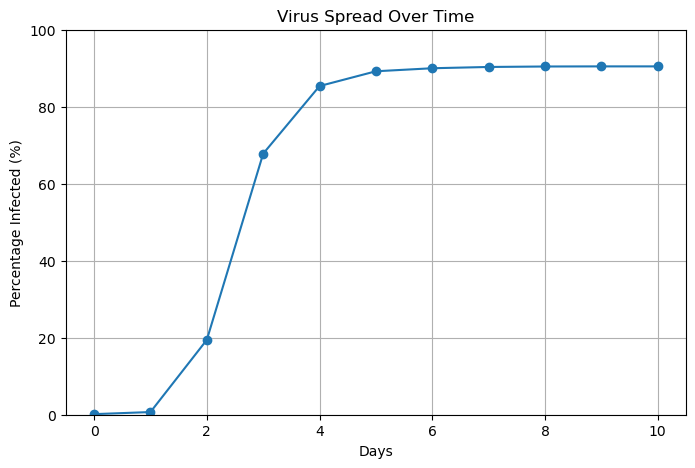

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()


### dont run unless you want animation

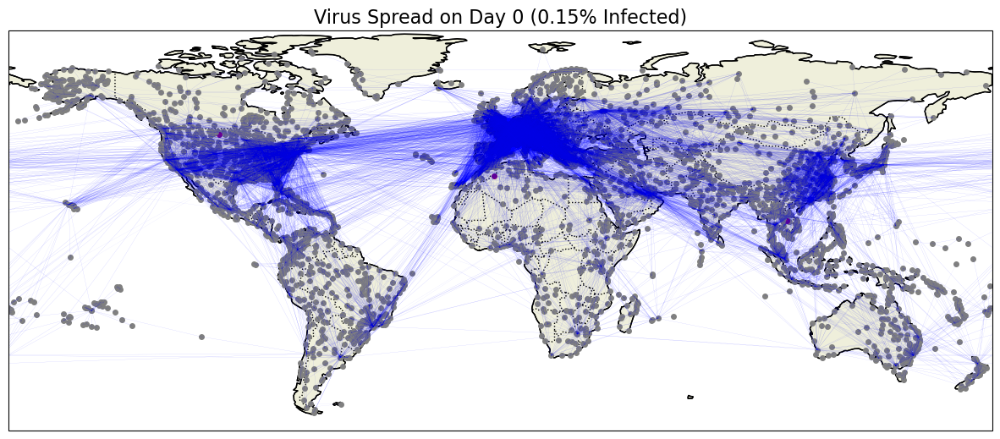

In [ ]:
# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_decayrate0.1.gif", writer='pillow', fps=1)

## Decay rate = 0.01

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 0.01
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility
initial_infected_count = 5

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Randomly select initial infected airports
initial_infected = random.sample(list(G.nodes), initial_infected_count)

print(initial_infected)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)



['CBH', 'UBP', 'DIK', 'SAV', 'ABD']


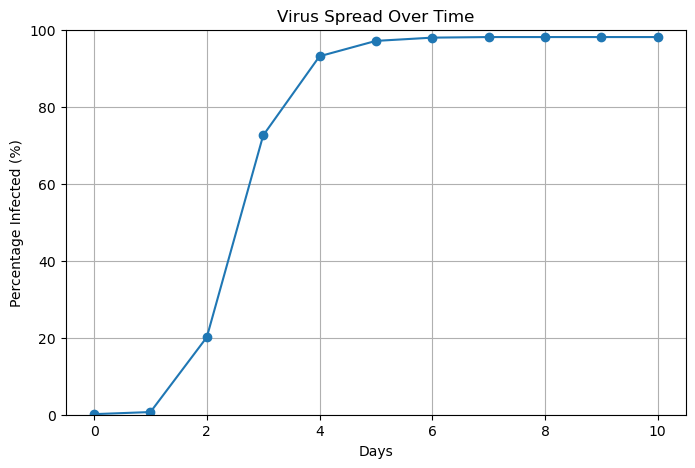

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()


## Last warning, if you dont go to bed now i will start dancing

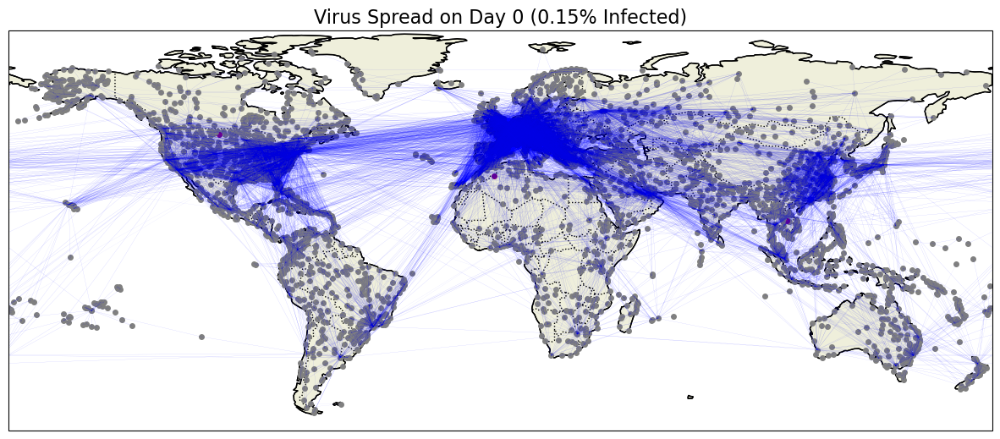

In [ ]:
# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_decayrate0.01.gif", writer='pillow', fps=1)

## decay rate = 0.05

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 0.05
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility
initial_infected_count = 5

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Randomly select initial infected airports
initial_infected = random.sample(list(G.nodes), initial_infected_count)

print(initial_infected)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)



['CBH', 'UBP', 'DIK', 'SAV', 'ABD']


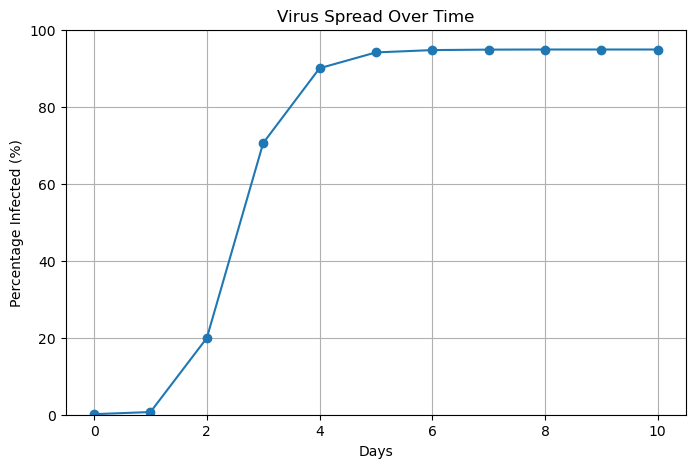

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()


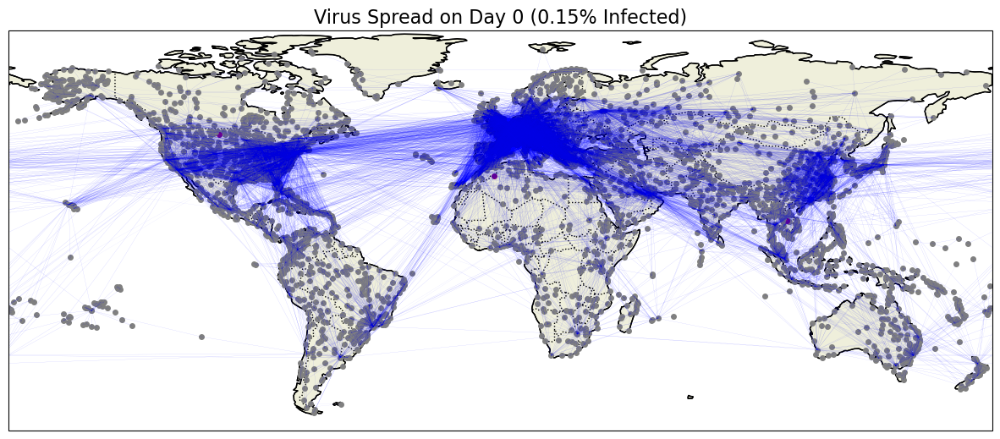

In [ ]:
# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_decayrate0.05.gif", writer='pillow', fps=1)

## Different decay rates

Initial infected: ['CBH', 'UBP', 'DIK', 'SAV', 'ABD']


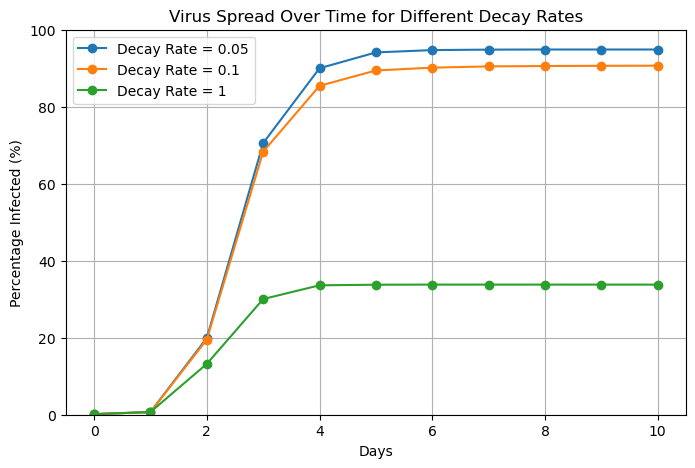

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import math

# Simulation Parameters
decay_rates = [0.05, 0.1, 1]  # List of decay rates to compare
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility
initial_infected_count = 5

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Randomly select initial infected airports
initial_infected = random.sample(list(G.nodes), initial_infected_count)
print("Initial infected:", initial_infected)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history


# Plot percentage of infected airports over time for different decay rates
plt.figure(figsize=(8, 5))

for decay_rate in decay_rates:
    spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)

    # Calculate infection percentage over time
    total_airports = len(G.nodes)
    infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

    # Ensure there is always a valid curve
    if sum(infection_percentages) > 0:
        plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-', label=f"Decay Rate = {decay_rate}")

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time for Different Decay Rates")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)
plt.legend()  # Show legend

# Show plot
plt.show()


['CBH', 'UBP', 'DIK', 'SAV', 'ABD']


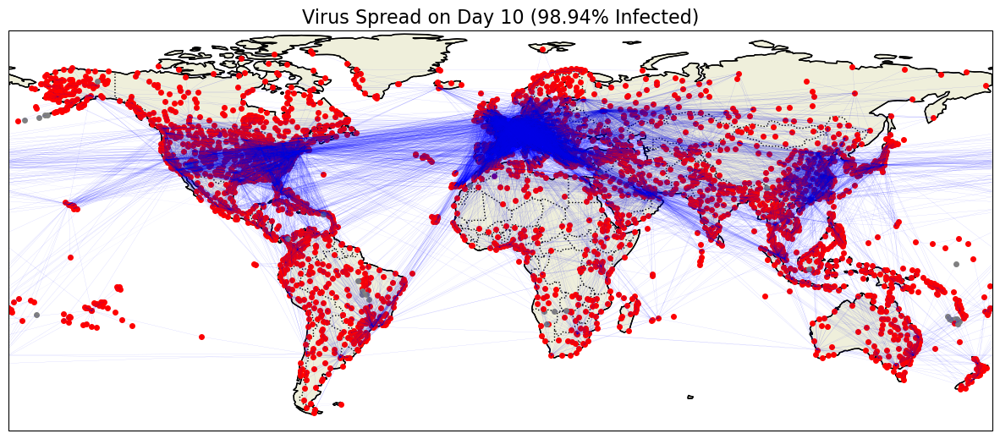

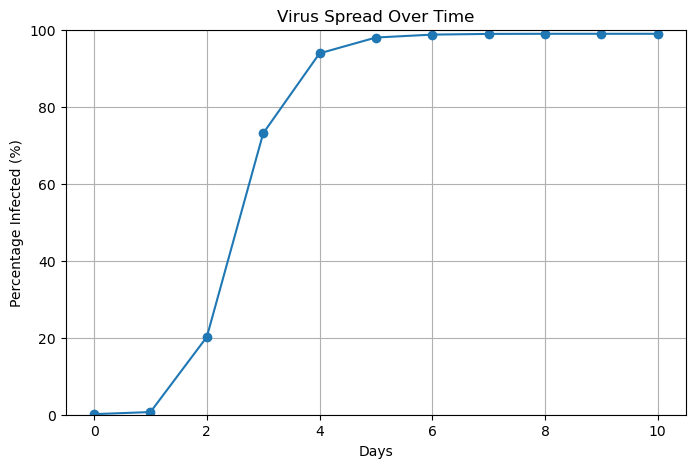

In [ ]:
# import networkx as nx
# import random
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

# # Simulation Parameters
# decay_rate = 0.01
# simulation_days = 10
# random_seed = 16  # Set the seed for reproducibility
# initial_infected_count = 5

# # Create a directed graph from the routes data
# G = nx.DiGraph()
# for _, row in routes.iterrows():
#     G.add_edge(
#         row['Source Airport'],
#         row['Destination Airport'],
#         distance=row['Distance_km']
#     )

# # Extract positions for the airports
# positions = {
#     row['IATA']: (row['Longitude'], row['Latitude'])
#     for _, row in airports_cleaned.iterrows()
#     if row['IATA'] in G.nodes
# }

# # Set the random seed
# random.seed(random_seed)

# # Randomly select initial infected airports
# initial_infected = random.sample(list(G.nodes), initial_infected_count)

# print(initial_infected)

# # Simulate Virus Spread
# def simulate_spread(graph, initial_infected, decay_rate, days):
#     infected = {airport: 0 for airport in graph.nodes}
#     active = set(initial_infected)
#     spread_history = [{} for _ in range(days + 1)]  # Include day 0

#     for day in range(days):
#         new_infected = set()
#         for airport in active:
#             for neighbor in graph.neighbors(airport):
#                 if infected[neighbor] == 0:  # Not yet infected
#                     prob = max(0.1, 1 - (day - infected[airport]) / decay_rate)
#                     if random.random() < prob:
#                         new_infected.add(neighbor)
#                         infected[neighbor] = day + 1

#         active = new_infected
#         spread_history[day + 1] = {a for a in infected if infected[a] > 0}

#     # Add initial infected to day 0
#     spread_history[0] = set(initial_infected)

#     return spread_history

# # Simulate virus spread
# spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)

# # Animation Setup
# fig = plt.figure(figsize=(15, 10))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.add_feature(cfeature.LAND, edgecolor='black')
# ax.add_feature(cfeature.COASTLINE)
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# def update(day):
#     ax.clear()
#     ax.add_feature(cfeature.LAND, edgecolor='black')
#     ax.add_feature(cfeature.COASTLINE)
#     ax.add_feature(cfeature.BORDERS, linestyle=':')

#     # Calculate percentage of infected nodes
#     total_nodes = len(G.nodes)
#     infected_count = len(spread_history[day])
#     infected_percentage = (infected_count / total_nodes) * 100

#     plt.title(
#         f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
#         fontsize=16
#     )

#     # Plot airports with dynamic colors based on infection status
#     for airport, (lon, lat) in positions.items():
#         if airport in spread_history[day]:
#             if airport in initial_infected:
#                 color = 'purple'  # Super-spreader and infected
#             else:
#                 color = 'red'  # Infected but not super-spreader
#         else:
#             color = 'gray'  # Not infected
#         plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

#     # Plot routes between airports
#     for source, dest in G.edges:
#         lon1, lat1 = positions[source]
#         lon2, lat2 = positions[dest]

#         # Adjust longitudes to prevent wrapping
#         lon1, lon2 = adjust_longitude(lon1, lon2)

#         plt.plot(
#             [lon1, lon2],
#             [lat1, lat2],
#             color='blue',
#             linewidth=0.1,
#             alpha=0.2,
#             transform=ccrs.PlateCarree()
#         )

# # Create the animation
# ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# # Save the animation as a GIF (optional)
# ani.save("virus_spread_simulation_decayrate0.01.gif", writer='pillow', fps=1)




# # Calculate the percentage of infected airports over time
# total_airports = len(G.nodes)
# infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# # Plot percentage of infected airports over time
# plt.figure(figsize=(8, 5))
# plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# # Labels and title
# plt.xlabel("Days")
# plt.ylabel("Percentage Infected (%)")
# plt.title("Virus Spread Over Time")
# plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
# plt.grid(True)

# # Show plot
# plt.show()



KeyboardInterrupt: 

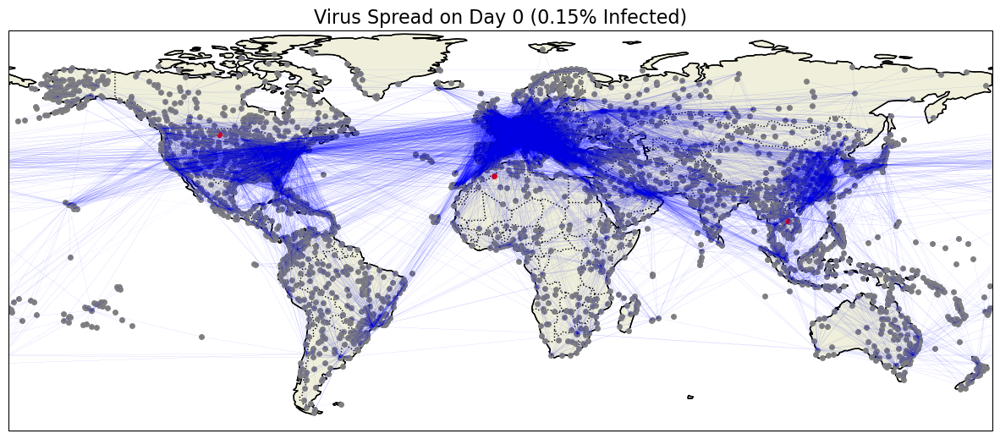

In [ ]:
# import networkx as nx
# import random
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

# # Simulation Parameters
# decay_rate = 0.1
# simulation_days = 10  # Includes Day 0
# initial_infected_count = 5
# random_seed = 16  # Set the seed for reproducibility

# # Create a directed graph from the routes data
# G = nx.DiGraph()
# for _, row in routes.iterrows():
#     G.add_edge(
#         row['Source Airport'],
#         row['Destination Airport'],
#         distance=row['Distance_km']
#     )

# # Extract positions for the airports
# positions = {
#     row['IATA']: (row['Longitude'], row['Latitude'])
#     for _, row in airports_cleaned.iterrows()
#     if row['IATA'] in G.nodes
# }

# # Set the random seed
# random.seed(random_seed)

# # Randomly select initial infected airports
# initial_infected = random.sample(list(G.nodes), initial_infected_count)

# # Get the top 20 airports
# top_20_airports = []
# top_20_airports_set = set([])

# # Simulate Virus Spread
# def simulate_spread(graph, initial_infected, decay_rate, days):
#     infected = {airport: 0 for airport in graph.nodes}  # 0 means not infected
#     active = set(initial_infected)

#     # Mark initial infected airports on Day 0
#     for airport in active:
#         infected[airport] = 0  # Infection starts from Day 0

#     spread_history = [{} for _ in range(days)]
#     spread_history[0] = active.copy()  # Store initial infections on Day 0

#     for day in range(days - 1):  # Start spreading from Day 0
#         new_infected = set()
#         for airport in active:
#             for neighbor in graph.neighbors(airport):
#                 if infected[neighbor] == 0:  # Not yet infected
#                     prob = max(0.1, 1 - (day - infected[airport]) / decay_rate)
#                     if random.random() < prob:
#                         new_infected.add(neighbor)
#                         infected[neighbor] = day  # Infection starts at current day

#         active = new_infected
#         spread_history[day + 1] = {a for a in infected if infected[a] >= 0}

#     return spread_history

# # Simulate virus spread
# spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)

# # Animation Setup
# fig = plt.figure(figsize=(15, 10))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.add_feature(cfeature.LAND, edgecolor='black')
# ax.add_feature(cfeature.COASTLINE)
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# def adjust_longitude(lon1, lon2):
#     """ Adjust longitudes to prevent wrapping in the plot """
#     if abs(lon2 - lon1) > 180:
#         if lon1 > lon2:
#             lon1 -= 360
#         else:
#             lon2 -= 360
#     return lon1, lon2

# def update(day):
#     ax.clear()
#     ax.add_feature(cfeature.LAND, edgecolor='black')
#     ax.add_feature(cfeature.COASTLINE)
#     ax.add_feature(cfeature.BORDERS, linestyle=':')

#     # Calculate percentage of infected nodes
#     total_nodes = len(G.nodes)
#     infected_count = len(spread_history[day])
#     infected_percentage = (infected_count / total_nodes) * 100

#     plt.title(
#         f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
#         fontsize=16
#     )

#     # Plot airports with dynamic colors based on infection status
#     for airport, (lon, lat) in positions.items():
#         if airport in spread_history[day]:
#             color = 'pink' if airport in top_20_airports_set else 'red'  # Infected
#         else:
#             color = 'gold' if airport in top_20_airports_set else 'gray'  # Not infected
#         plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

#     # Plot routes between airports
#     for source, dest in G.edges:
#         if source in positions and dest in positions:
#             lon1, lat1 = positions[source]
#             lon2, lat2 = positions[dest]
#             lon1, lon2 = adjust_longitude(lon1, lon2)

#             plt.plot(
#                 [lon1, lon2],
#                 [lat1, lat2],
#                 color='blue',
#                 linewidth=0.1,
#                 alpha=0.2,
#                 transform=ccrs.PlateCarree()
#             )

# ani = FuncAnimation(fig, update, frames=simulation_days, repeat=False)

# # Save the animation as a GIF (optional)
# ani.save("virus_spread_simulation_with_day_0_start.gif", writer='pillow', fps=1)


In [ ]:
# for i in range(10):
#     print(i, end=", ") # prints: 0, 1, 2, 3, 4,

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 

## Decay rate equals to 2 same as equal to 3

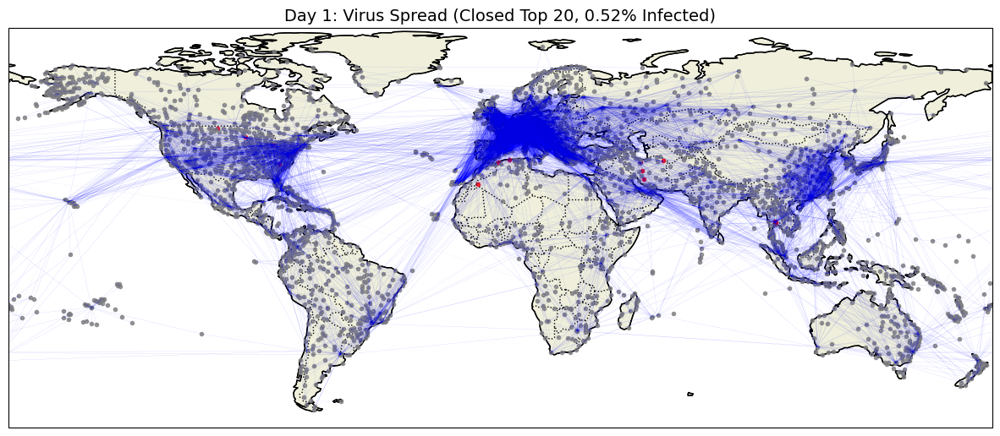

In [ ]:
# import networkx as nx
# import random
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

# # Simulation Parameters
# decay_rate = 2
# simulation_days = 10
# initial_infected_count = 5
# random_seed = 16  # Set the seed for reproducibility

# # Create a directed graph from the routes data
# G = nx.DiGraph()
# for _, row in routes.iterrows():
#     G.add_edge(
#         row['Source Airport'],
#         row['Destination Airport'],
#         distance=row['Distance_km']
#     )

# # Extract positions for the airports
# positions = {
#     row['IATA']: (row['Longitude'], row['Latitude'])
#     for _, row in airports_cleaned.iterrows()
#     if row['IATA'] in G.nodes
# }

# # Set the random seed
# random.seed(random_seed)

# # Randomly select initial infected airports
# initial_infected = random.sample(list(G.nodes), initial_infected_count)

# # Get the top 20 airports (precomputed)
# top_20_airports = sorted_airports[:20]  # Replace with your actual computation
# top_20_airports_set = set([airport for airport, score in top_20_airports])

# # Remove Top 20 Airports from the Graph
# G_without_top_20 = G.copy()
# G_without_top_20.remove_nodes_from(top_20_airports_set)

# # Simulate Virus Spread
# def simulate_spread(graph, initial_infected, decay_rate, days):
#     infected = {airport: 0 for airport in graph.nodes}
#     active = set(initial_infected)
#     spread_history = [{} for _ in range(days)]

#     for day in range(days):
#         new_infected = set()
#         for airport in active:
#             for neighbor in graph.neighbors(airport):
#                 if infected[neighbor] == 0:  # Not yet infected
#                     prob = max(0.1, 1 - (day - infected[airport]) / decay_rate)
#                     if random.random() < prob:
#                         new_infected.add(neighbor)
#                         infected[neighbor] = day + 1

#         active = new_infected
#         spread_history[day] = {a for a in infected if infected[a] > 0}
#     return spread_history

# # Simulate virus spread on the graph without top 20 airports
# spread_history_modified = simulate_spread(G_without_top_20, initial_infected, decay_rate, simulation_days)

# # Animation Setup
# fig = plt.figure(figsize=(15, 10))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.add_feature(cfeature.LAND, edgecolor='black')
# ax.add_feature(cfeature.COASTLINE)
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# def update(day):
#     ax.clear()
#     ax.add_feature(cfeature.LAND, edgecolor='black')
#     ax.add_feature(cfeature.COASTLINE)
#     ax.add_feature(cfeature.BORDERS, linestyle=':')

#     # Plot Title
#     infected_count_modified = len(spread_history_modified[day])
#     total_nodes = len(G_without_top_20.nodes)
#     infected_percentage_modified = (infected_count_modified / total_nodes) * 100

#     plt.title(f"Day {day + 1}: Virus Spread (Closed Top 20, {infected_percentage_modified:.2f}% Infected)", fontsize=14)

#     # Plot airports for modified graph
#     for airport, (lon, lat) in positions.items():
#         if airport in G_without_top_20.nodes:
#             if airport in spread_history_modified[day]:
#                 color = 'red'  # Infected node in modified graph
#             else:
#                 color = 'gray'  # Non-infected node in modified graph
#             plt.plot(lon, lat, marker='o', markersize=3, color=color, alpha=0.8, transform=ccrs.PlateCarree())

#     # Plot routes between airports in the modified graph
#     for source, dest in G_without_top_20.edges:
#         lon1, lat1 = positions[source]
#         lon2, lat2 = positions[dest]

#         # Adjust longitudes to prevent wrapping
#         lon1, lon2 = adjust_longitude(lon1, lon2)

#         plt.plot(
#             [lon1, lon2],
#             [lat1, lat2],
#             color='blue',
#             linewidth=0.1,
#             alpha=0.2,
#             transform=ccrs.PlateCarree()
#         )

# ani = FuncAnimation(fig, update, frames=simulation_days, repeat=False)

# # Save the animation as a GIF (optional)
# ani.save("virus_spread_with_top_20_closed_only.gif", writer='pillow', fps=1)



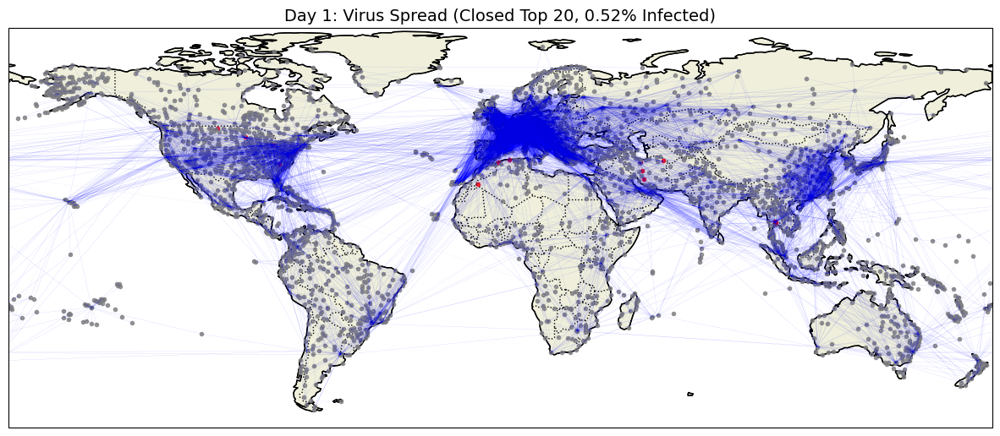

In [ ]:
# import networkx as nx
# import random
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

# # Simulation Parameters
# decay_rate = 10
# simulation_days = 10
# initial_infected_count = 5
# random_seed = 16  # Set the seed for reproducibility

# # Create a directed graph from the routes data
# G = nx.DiGraph()
# for _, row in routes.iterrows():
#     G.add_edge(
#         row['Source Airport'],
#         row['Destination Airport'],
#         distance=row['Distance_km']
#     )

# # Extract positions for the airports
# positions = {
#     row['IATA']: (row['Longitude'], row['Latitude'])
#     for _, row in airports_cleaned.iterrows()
#     if row['IATA'] in G.nodes
# }

# # Set the random seed
# random.seed(random_seed)

# # Randomly select initial infected airports
# initial_infected = random.sample(list(G.nodes), initial_infected_count)

# # Get the top 20 airports (precomputed)
# top_20_airports = sorted_airports[:20]  # Replace with your actual computation
# top_20_airports_set = set([airport for airport, score in top_20_airports])

# # Remove Top 20 Airports from the Graph
# G_without_top_20 = G.copy()
# G_without_top_20.remove_nodes_from(top_20_airports_set)

# # Simulate Virus Spread
# def simulate_spread(graph, initial_infected, decay_rate, days):
#     infected = {airport: 0 for airport in graph.nodes}
#     active = set(initial_infected)
#     spread_history = [{} for _ in range(days)]

#     for day in range(days):
#         new_infected = set()
#         for airport in active:
#             for neighbor in graph.neighbors(airport):
#                 if infected[neighbor] == 0:  # Not yet infected
#                     prob = max(0.1, 1 - (day - infected[airport]) / decay_rate)
#                     if random.random() < prob:
#                         new_infected.add(neighbor)
#                         infected[neighbor] = day + 1

#         active = new_infected
#         spread_history[day] = {a for a in infected if infected[a] > 0}
#     return spread_history

# # Simulate virus spread on the graph without top 20 airports
# spread_history_modified = simulate_spread(G_without_top_20, initial_infected, decay_rate, simulation_days)

# # Animation Setup
# fig = plt.figure(figsize=(15, 10))
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.add_feature(cfeature.LAND, edgecolor='black')
# ax.add_feature(cfeature.COASTLINE)
# ax.add_feature(cfeature.BORDERS, linestyle=':')

# def update(day):
#     ax.clear()
#     ax.add_feature(cfeature.LAND, edgecolor='black')
#     ax.add_feature(cfeature.COASTLINE)
#     ax.add_feature(cfeature.BORDERS, linestyle=':')

#     # Plot Title
#     infected_count_modified = len(spread_history_modified[day])
#     total_nodes = len(G_without_top_20.nodes)
#     infected_percentage_modified = (infected_count_modified / total_nodes) * 100

#     plt.title(f"Day {day + 1}: Virus Spread (Closed Top 20, {infected_percentage_modified:.2f}% Infected)", fontsize=14)

#     # Plot airports for modified graph
#     for airport, (lon, lat) in positions.items():
#         if airport in G_without_top_20.nodes:
#             if airport in spread_history_modified[day]:
#                 color = 'red'  # Infected node in modified graph
#             else:
#                 color = 'gray'  # Non-infected node in modified graph
#             plt.plot(lon, lat, marker='o', markersize=3, color=color, alpha=0.8, transform=ccrs.PlateCarree())

#     # Plot routes between airports in the modified graph
#     for source, dest in G_without_top_20.edges:
#         lon1, lat1 = positions[source]
#         lon2, lat2 = positions[dest]

#         # Adjust longitudes to prevent wrapping
#         lon1, lon2 = adjust_longitude(lon1, lon2)

#         plt.plot(
#             [lon1, lon2],
#             [lat1, lat2],
#             color='blue',
#             linewidth=0.1,
#             alpha=0.2,
#             transform=ccrs.PlateCarree()
#         )

# ani = FuncAnimation(fig, update, frames=simulation_days, repeat=False)

# # Save the animation as a GIF (optional)
# ani.save("virus_spread_with_top_20_closed_only_decayrate10.gif", writer='pillow', fps=1)



In [ ]:
# Calculate degree centrality without weights (sum of in-degree and out-degree)
degree_centrality = {node: sum(d for _, d in G.degree([node])) for node in G.nodes}

# Sort airports by degree centrality in descending order
sorted_by_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Display the top 5 airports with highest degree centrality
print("Top 5 Airports by Degree Centrality (Unweighted):")
for airport, degree in sorted_by_degree[:5]:
    print(f"Airport: {airport}, Degree Centrality: {degree}")

# Get the top 5 airports based on composite centrality
top_5_airports_degree = sorted_by_degree[:5]
top_5_airports_degree_set = set([airport for airport, score in top_5_airports_degree])


Top 5 Airports by Degree Centrality (Unweighted):
Airport: FRA, Degree Centrality: 519
Airport: AMS, Degree Centrality: 485
Airport: CDG, Degree Centrality: 467
Airport: ATL, Degree Centrality: 450
Airport: IST, Degree Centrality: 437


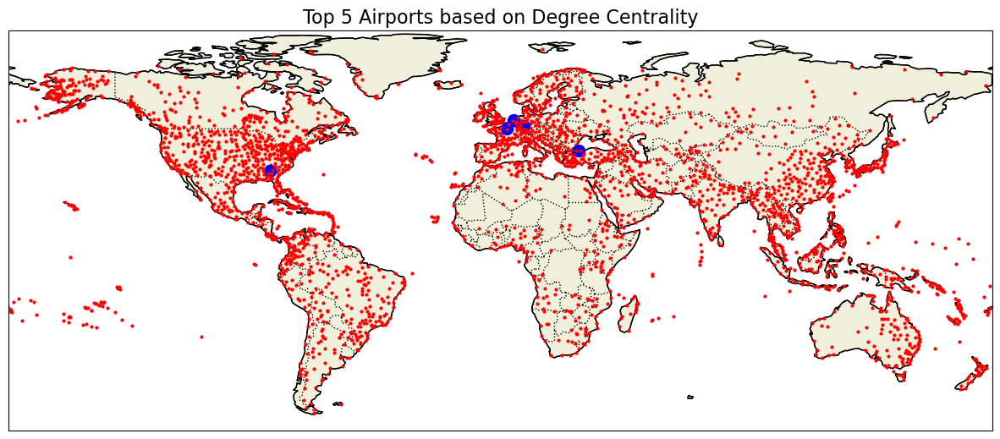

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Sort airports by composite centrality score (assuming you have already calculated this)
# For demonstration, let's assume top_20_airports_set is already defined
# (you would use the sorted composite centrality logic here)

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot only the top 5 airports with blue color and others with red color
for airport, (lon, lat) in positions.items():
    if airport in top_5_airports_degree_set:
        # Top 5 airports in blue
        plt.plot(lon, lat, marker='o', markersize=10, color='blue', transform=ccrs.PlateCarree())
    else:
        # Other airports in red
        plt.plot(lon, lat, marker='o', markersize=2, color='red', transform=ccrs.PlateCarree())


# Add a title and show the plot
plt.title("Top 5 Airports based on Degree Centrality", fontsize=16)
plt.show()



In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 0.05
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Set the initial infected airports to the top 5 airports by degree centrality
initial_infected = [airport for airport, _ in sorted_by_degree[:5]]  # Top 5 airports by degree centrality

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)



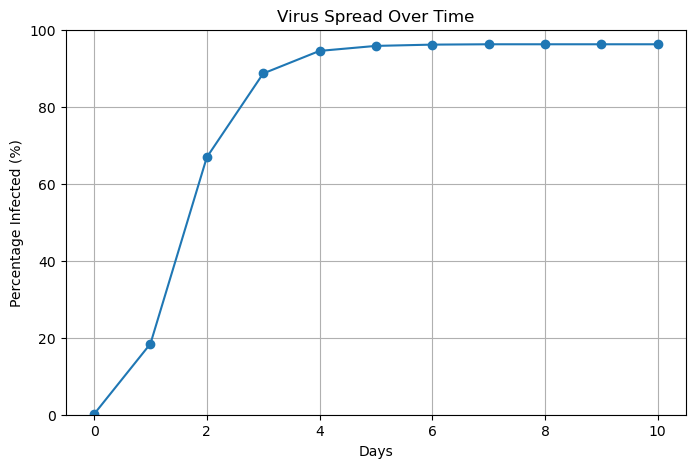

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()

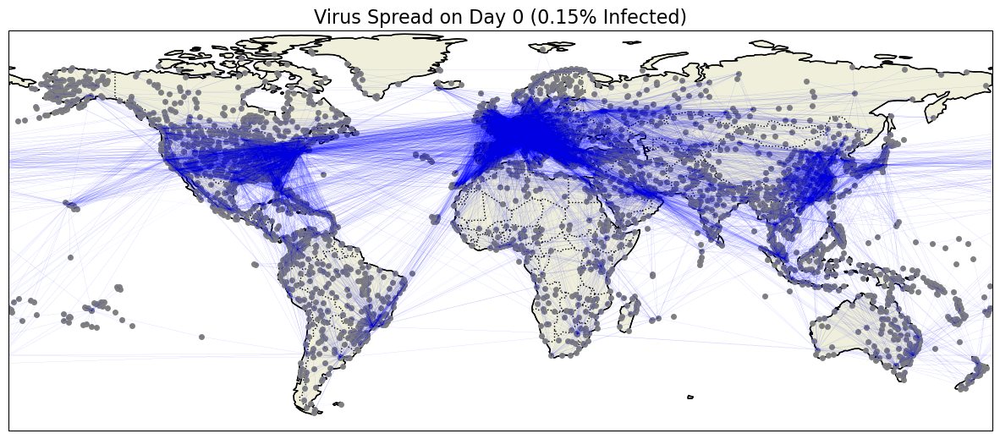

In [ ]:
# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_top_5_degree_testing.gif", writer='pillow', fps=1)

In [ ]:
# Calculate PageRank centrality (normalized scores by default)
pagerank_centrality = nx.pagerank(G)

# Sort airports by PageRank centrality in descending order
sorted_by_pagerank = sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)

# Display the top 5 airports with the highest PageRank centrality
print("Top 5 Airports by PageRank Centrality:")
for airport, pagerank_score in sorted_by_pagerank[:5]:
    print(f"Airport: {airport}, PageRank Centrality: {pagerank_score}")

# Get the top 5 airports based on PageRank centrality
top_5_airports_pagerank = sorted_by_pagerank[:5]
top_5_airports_pagerank_set = set([airport for airport, score in top_5_airports_pagerank])


Top 5 Airports by PageRank Centrality:
Airport: ATL, PageRank Centrality: 0.004837754374655826
Airport: DEN, PageRank Centrality: 0.004594009608940541
Airport: DFW, PageRank Centrality: 0.004478144569630292
Airport: ORD, PageRank Centrality: 0.004448958181000849
Airport: FRA, PageRank Centrality: 0.004051571705238466


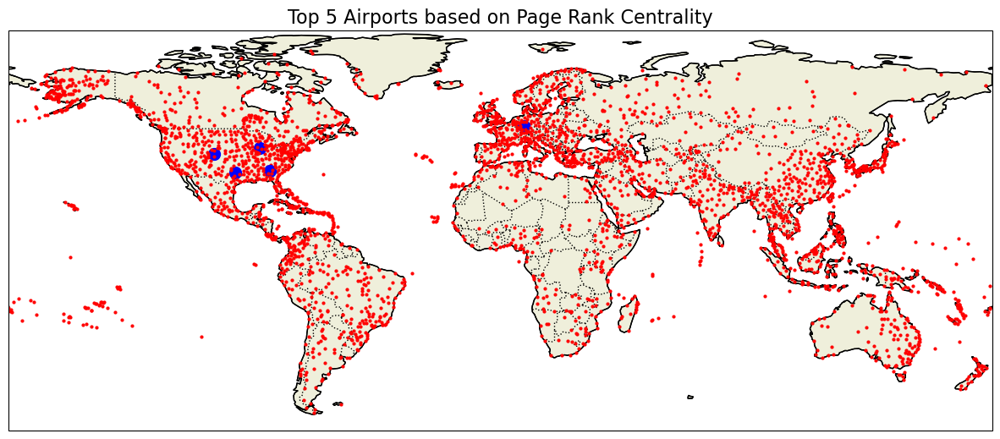

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Sort airports by composite centrality score (assuming you have already calculated this)
# For demonstration, let's assume top_20_airports_set is already defined
# (you would use the sorted composite centrality logic here)

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot only the top 5 airports with blue color and others with red color
for airport, (lon, lat) in positions.items():
    if airport in top_5_airports_pagerank_set:
        # Top 5 airports in blue
        plt.plot(lon, lat, marker='o', markersize=10, color='blue', transform=ccrs.PlateCarree())
    else:
        # Other airports in red
        plt.plot(lon, lat, marker='o', markersize=2, color='red', transform=ccrs.PlateCarree())


# Add a title and show the plot
plt.title("Top 5 Airports based on Page Rank Centrality", fontsize=16)
plt.show()



In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 0.05
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Set the initial infected airports to the top 5 airports by Page Rank
initial_infected = [airport for airport, _ in sorted_by_pagerank[:5]]  # Top 5 airports by Page Rank

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)




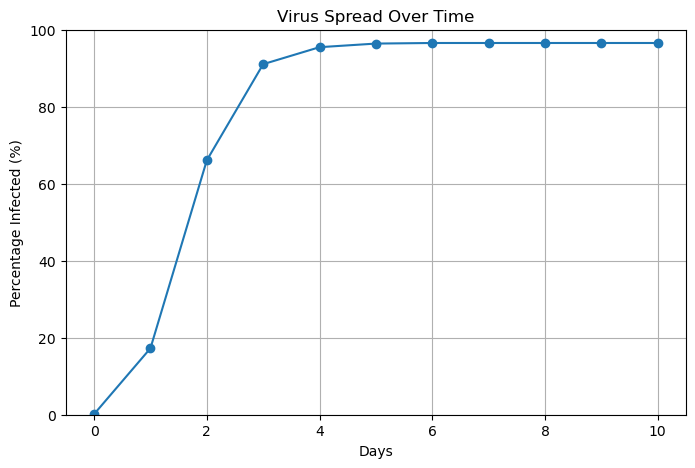

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()

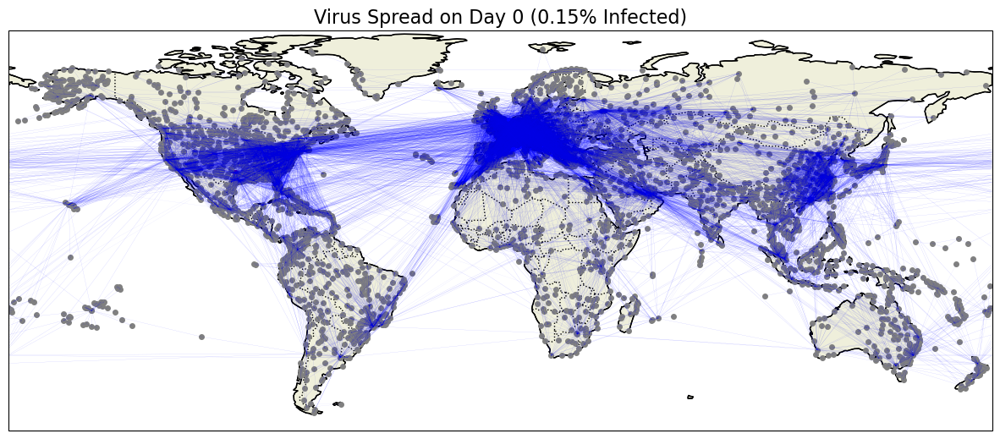

In [ ]:
# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_top_5_pagerank_testing.gif", writer='pillow', fps=1)


In [ ]:
# Calculate betweenness centrality (normalized scores by default)
betweenness_centrality = nx.betweenness_centrality(G)

# Sort airports by betweenness centrality in descending order
sorted_by_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Display the top 5 airports with the highest betweenness centrality
print("Top 5 Airports by Betweenness Centrality:")
for airport, betweenness_score in sorted_by_betweenness[:5]:
    print(f"Airport: {airport}, Betweenness Centrality: {betweenness_score}")

# Get the top 5 airports based on betweenness centrality
top_5_airports_betweenness = sorted_by_betweenness[:5]
top_5_airports_betweenness_set = set([airport for airport, score in top_5_airports_betweenness])


Top 5 Airports by Betweenness Centrality:
Airport: FRA, Betweenness Centrality: 0.07492634870208506
Airport: ANC, Betweenness Centrality: 0.06724153288310078
Airport: DXB, Betweenness Centrality: 0.05631160387443982
Airport: LAX, Betweenness Centrality: 0.055137101341640224
Airport: CDG, Betweenness Centrality: 0.053078558283899784


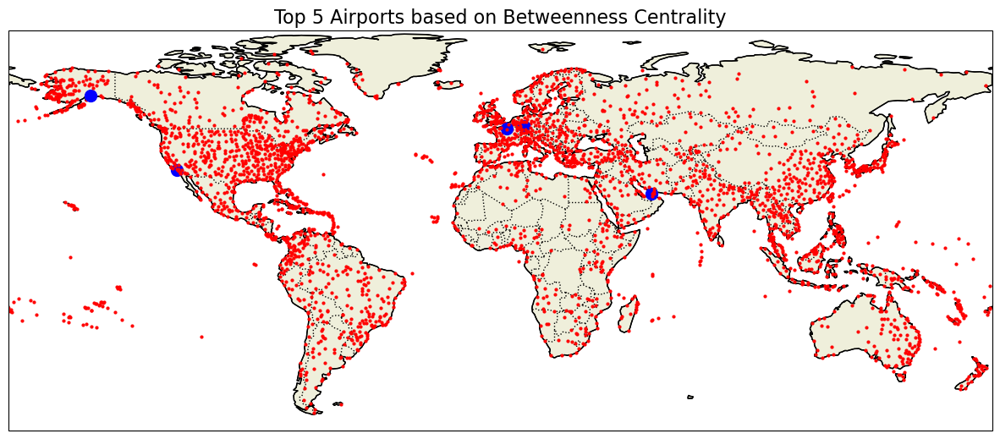

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create a directed graph from the routes data
G = nx.DiGraph()

# Add edges to the graph with route distances as attributes
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Sort airports by composite centrality score (assuming you have already calculated this)
# For demonstration, let's assume top_20_airports_set is already defined
# (you would use the sorted composite centrality logic here)

# Plot the world map
plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot only the top 5 airports with blue color and others with red color
for airport, (lon, lat) in positions.items():
    if airport in top_5_airports_betweenness_set:
        # Top 5 airports in blue
        plt.plot(lon, lat, marker='o', markersize=10, color='blue', transform=ccrs.PlateCarree())
    else:
        # Other airports in red
        plt.plot(lon, lat, marker='o', markersize=2, color='red', transform=ccrs.PlateCarree())


# Add a title and show the plot
plt.title("Top 5 Airports based on Betweenness Centrality", fontsize=16)
plt.show()



In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import math

# Simulation Parameters
decay_rate = 0.05
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility

# Create a directed graph from the routes data
G = nx.DiGraph()
for _, row in routes.iterrows():
    G.add_edge(
        row['Source Airport'],
        row['Destination Airport'],
        distance=row['Distance_km']
    )

# Extract positions for the airports
positions = {
    row['IATA']: (row['Longitude'], row['Latitude'])
    for _, row in airports_cleaned.iterrows()
    if row['IATA'] in G.nodes
}

# Set the random seed
random.seed(random_seed)

# Set the initial infected airports to the top 5 airports by betweenness centrality
initial_infected = [airport for airport, _ in sorted_by_betweenness[:5]]  # Top 5 airports by betweenness centrality

print(initial_infected)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# Simulate virus spread
spread_history = simulate_spread(G, initial_infected, decay_rate, simulation_days)





['FRA', 'ANC', 'DXB', 'LAX', 'CDG']


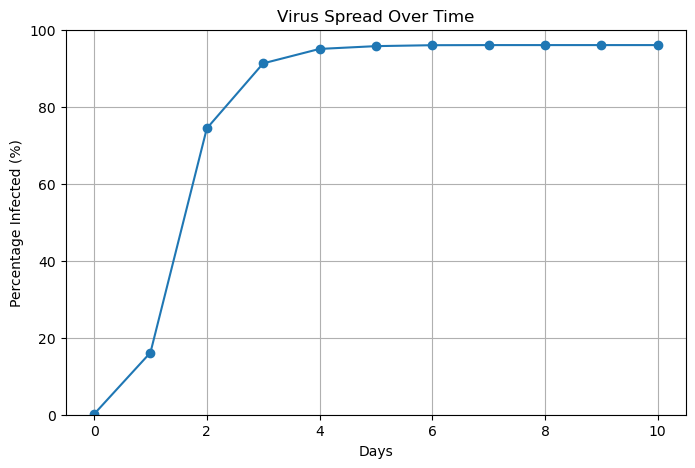

In [ ]:
# Calculate the percentage of infected airports over time
total_airports = len(G.nodes)
infection_percentages = [(len(spread_history[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# Plot percentage of infected airports over time
plt.figure(figsize=(8, 5))
plt.plot(range(simulation_days + 1), infection_percentages, marker='o', linestyle='-')

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)

# Show plot
plt.show()

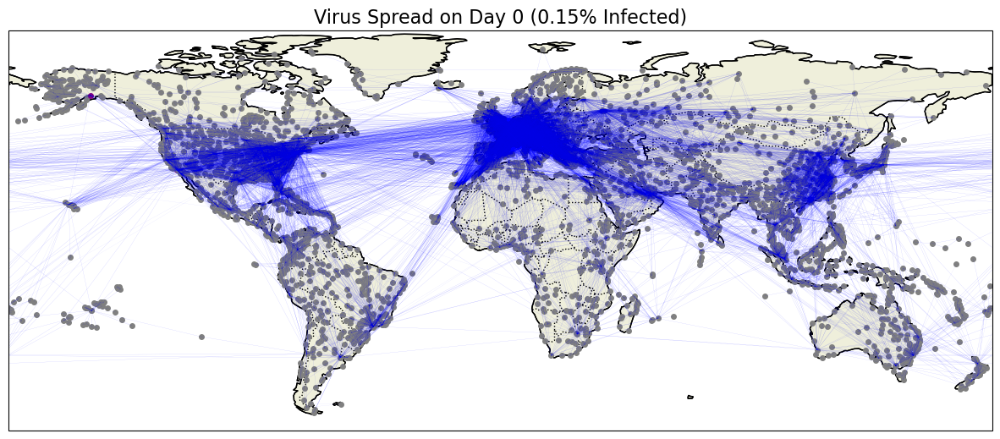

In [ ]:
# Animation Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

def update(day):
    ax.clear()
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')

    # Calculate percentage of infected nodes
    total_nodes = len(G.nodes)
    infected_count = len(spread_history[day])
    infected_percentage = (infected_count / total_nodes) * 100

    plt.title(
        f"Virus Spread on Day {day} ({infected_percentage:.2f}% Infected)",
        fontsize=16
    )

    # Plot airports with dynamic colors based on infection status
    for airport, (lon, lat) in positions.items():
        if airport in spread_history[day]:
            if airport in initial_infected:
                color = 'purple'  # Super-spreader and infected
            else:
                color = 'red'  # Infected but not super-spreader
        else:
            color = 'gray'  # Not infected
        plt.plot(lon, lat, marker='o', markersize=4, color=color, transform=ccrs.PlateCarree())

    # Plot routes between airports
    for source, dest in G.edges:
        lon1, lat1 = positions[source]
        lon2, lat2 = positions[dest]

        # Adjust longitudes to prevent wrapping
        lon1, lon2 = adjust_longitude(lon1, lon2)

        plt.plot(
            [lon1, lon2],
            [lat1, lat2],
            color='blue',
            linewidth=0.1,
            alpha=0.2,
            transform=ccrs.PlateCarree()
        )

# Create the animation
ani = FuncAnimation(fig, update, frames=simulation_days + 1, repeat=False)

# Save the animation as a GIF (optional)
ani.save("virus_spread_simulation_top_5_betweenness_testing.gif", writer='pillow', fps=1)


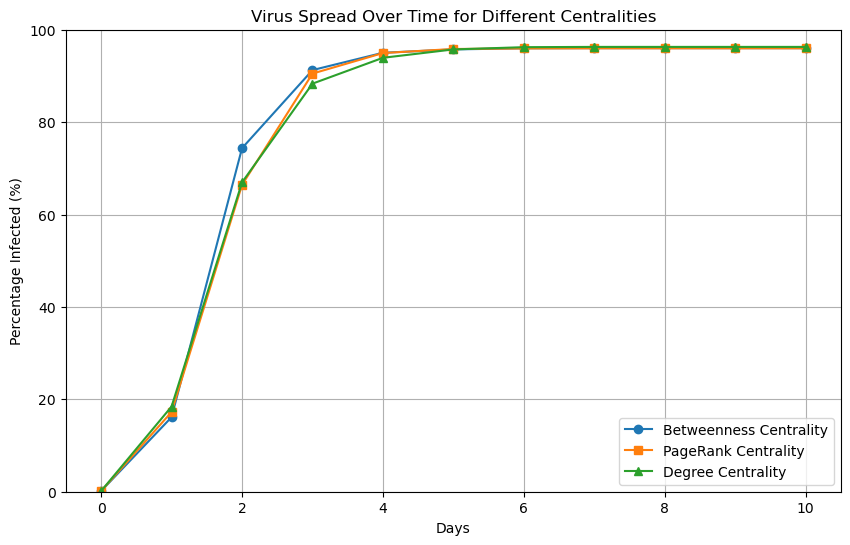

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import math

# Simulation Parameters
decay_rate = 0.05  # Set to a reasonable value
simulation_days = 10
random_seed = 16  # Set the seed for reproducibility

# Set the random seed
random.seed(random_seed)

# Simulate Virus Spread
def simulate_spread(graph, initial_infected, decay_rate, days):
    infected = {airport: 0 for airport in graph.nodes}
    active = set(initial_infected)
    spread_history = [{} for _ in range(days + 1)]  # Include day 0

    for day in range(days):
        new_infected = set()
        for airport in active:
            for neighbor in graph.neighbors(airport):
                if infected[neighbor] == 0:  # Not yet infected
                    prob = max(0.001, math.exp(- decay_rate * day))
                    if random.random() < prob:
                        new_infected.add(neighbor)
                        infected[neighbor] = 1

        active = new_infected
        spread_history[day + 1] = {a for a in infected if infected[a] > 0}

    # Add initial infected to day 0
    spread_history[0] = set(initial_infected)

    return spread_history

# **1. Calculate Centralities**
# Betweenness
betweenness_centrality = nx.betweenness_centrality(G)
sorted_by_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
top_5_betweenness = [airport for airport, _ in sorted_by_betweenness[:5]]

# PageRank
pagerank_centrality = nx.pagerank(G)
sorted_by_pagerank = sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)
top_5_pagerank = [airport for airport, _ in sorted_by_pagerank[:5]]

# Degree
degree_centrality = {node: sum(d for _, d in G.degree([node])) for node in G.nodes}
sorted_by_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)
top_5_degree = [airport for airport, _ in sorted_by_degree[:5]]

# **2. Simulate virus spread for each centrality**
spread_betweenness = simulate_spread(G, top_5_betweenness, decay_rate, simulation_days)
spread_pagerank = simulate_spread(G, top_5_pagerank, decay_rate, simulation_days)
spread_degree = simulate_spread(G, top_5_degree, decay_rate, simulation_days)

# **3. Calculate infection percentages**
total_airports = len(G.nodes)
infection_betweenness = [(len(spread_betweenness[day]) / total_airports) * 100 for day in range(simulation_days + 1)]
infection_pagerank = [(len(spread_pagerank[day]) / total_airports) * 100 for day in range(simulation_days + 1)]
infection_degree = [(len(spread_degree[day]) / total_airports) * 100 for day in range(simulation_days + 1)]

# **4. Plot the results**
plt.figure(figsize=(10, 6))
plt.plot(range(simulation_days + 1), infection_betweenness, marker='o', linestyle='-', label="Betweenness Centrality")
plt.plot(range(simulation_days + 1), infection_pagerank, marker='s', linestyle='-', label="PageRank Centrality")
plt.plot(range(simulation_days + 1), infection_degree, marker='^', linestyle='-', label="Degree Centrality")

# Labels and title
plt.xlabel("Days")
plt.ylabel("Percentage Infected (%)")
plt.title("Virus Spread Over Time for Different Centralities")
plt.ylim(0, 100)  # Ensure y-axis is from 0 to 100%
plt.grid(True)
plt.legend()

# Show plot
plt.show()


In [ ]:
import networkx as nx

# **1. Compute centrality measures**
betweenness_centrality = nx.betweenness_centrality(G)
pagerank_centrality = nx.pagerank(G)
degree_centrality = {node: sum(d for _, d in G.degree([node])) for node in G.nodes}

# **2. Sort each measure**
sorted_by_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
sorted_by_pagerank = sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)
sorted_by_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# **3. Get rankings**
pagerank_rank = {airport: rank + 1 for rank, (airport, _) in enumerate(sorted_by_pagerank)}
degree_rank = {airport: rank + 1 for rank, (airport, _) in enumerate(sorted_by_degree)}

# **4. Extract top 5 airports by betweenness**
top_5_airports_betweenness = [airport for airport, _ in sorted_by_betweenness[:5]]

# **5. Print degree and PageRank for the top 5 betweenness airports**
print("Top 5 Airports by Betweenness Centrality with Degree and PageRank Ranking:")
print("-" * 80)
print(f"{'Airport':<10} {'Betweenness':<15} {'Degree':<10} {'Degree Rank':<12} {'PageRank':<10} {'PageRank Rank'}")
print("-" * 80)

for airport in top_5_airports_betweenness:
    betweenness_score = betweenness_centrality[airport]
    degree_score = degree_centrality[airport]
    pagerank_score = pagerank_centrality[airport]
    print(f"{airport:<10} {betweenness_score:<15.6f} {degree_score:<10} {degree_rank[airport]:<12} {pagerank_score:<10.6f} {pagerank_rank[airport]}")



Top 5 Airports by Betweenness Centrality with Degree and PageRank Ranking:
--------------------------------------------------------------------------------
Airport    Betweenness     Degree     Degree Rank  PageRank   PageRank Rank
--------------------------------------------------------------------------------
FRA        0.074926        519        1            0.004052   5
ANC        0.067242        84         241          0.002050   67
DXB        0.056312        362        14           0.003530   13
LAX        0.055137        319        23           0.003630   11
CDG        0.053079        467        3            0.003713   9
